In [1]:
import pandas as pd   
import numpy as np    
import matplotlib.pyplot as plt 
%matplotlib inline
%config InlineBackend.figure_formats = ['retina']
import seaborn as sns
import time
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, log_loss
from sklearn.metrics import auc, roc_curve, roc_auc_score, precision_recall_curve
from sklearn.metrics import fbeta_score, cohen_kappa_score
SEED = 42

In [2]:
df=pd.read_csv('preprocessed_datset.csv')  
df.head()

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.065927,88.0,174.0,57.5,39.0,95.5,106.5,20.0,1,0
1,0,8,26.989619,78.0,170.0,57.0,36.5,90.0,100.0,20.0,1,0
2,0,16,23.939481,75.0,177.0,59.0,39.0,88.0,104.0,20.0,1,0
3,0,15,22.129740,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
4,0,15,22.129740,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0


In [3]:
print ('Rows     : ', df.shape[0])  #show total no.of rows in dataset
print ('Columns  : ', df.shape[1]) #show total no.of columns(features) in dataset
print ('\nFeatures : \n', df.columns.tolist())  #show the features in dataset
print ('\nMissing values :  ', df.isnull().sum().values.sum()) #  show total no.of missing values in dataset
print ('\nUnique values :  \n', df.nunique()) # show total no.of unique values in each feature of dataset

Rows     :  5208
Columns  :  12

Features : 
 ['BQ', 'ESS', 'BMI', 'Weight', 'Height', 'Head', 'Neck', 'Waist', 'Buttock', 'Age', 'M', 'status']

Missing values :   0

Unique values :  
 BQ            2
ESS          29
BMI        2076
Weight      434
Height      120
Head        113
Neck        166
Waist       256
Buttock     208
Age          63
M             2
status        4
dtype: int64


In [4]:
df.info() #  show datatype of ecah feature in dataset
df.isnull().sum() # show total no.of null values of features in dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5208 entries, 0 to 5207
Data columns (total 12 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   BQ       5208 non-null   int64  
 1   ESS      5208 non-null   int64  
 2   BMI      5208 non-null   float64
 3   Weight   5208 non-null   float64
 4   Height   5208 non-null   float64
 5   Head     5208 non-null   float64
 6   Neck     5208 non-null   float64
 7   Waist    5208 non-null   float64
 8   Buttock  5208 non-null   float64
 9   Age      5208 non-null   float64
 10  M        5208 non-null   int64  
 11  status   5208 non-null   int64  
dtypes: float64(8), int64(4)
memory usage: 488.4 KB


BQ         0
ESS        0
BMI        0
Weight     0
Height     0
Head       0
Neck       0
Waist      0
Buttock    0
Age        0
M          0
status     0
dtype: int64

In [5]:
df = df.dropna() # hepls in droppind the null values in datset
df.info()
print ('\nMissing values :  ', df.isnull().sum().values.sum())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5208 entries, 0 to 5207
Data columns (total 12 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   BQ       5208 non-null   int64  
 1   ESS      5208 non-null   int64  
 2   BMI      5208 non-null   float64
 3   Weight   5208 non-null   float64
 4   Height   5208 non-null   float64
 5   Head     5208 non-null   float64
 6   Neck     5208 non-null   float64
 7   Waist    5208 non-null   float64
 8   Buttock  5208 non-null   float64
 9   Age      5208 non-null   float64
 10  M        5208 non-null   int64  
 11  status   5208 non-null   int64  
dtypes: float64(8), int64(4)
memory usage: 528.9 KB

Missing values :   0


In [6]:
df.describe() # It gives statstical data of the dataset

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
count,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000
mean,0.228879,9.783794,26.585641,75.417800,168.040995,56.473109,37.681834,91.126517,100.827016,45.373771,0.762673,1.329685
std,0.420151,5.794717,5.255564,17.170054,8.154482,2.083129,4.154456,13.571392,9.546028,13.099994,0.425485,1.486572
min,0.000000,0.000000,14.765497,37.000000,140.000000,47.000000,26.000000,56.000000,70.000000,20.000000,0.000000,0.000000
25%,0.000000,6.000000,23.120624,64.000000,163.000000,55.000000,35.000000,83.000000,95.000000,35.000000,1.000000,0.000000
50%,0.000000,10.000000,25.795918,74.000000,169.000000,56.500000,37.500000,90.000000,99.500000,44.500000,1.000000,0.000000
75%,0.000000,14.000000,29.000595,85.000000,174.000000,58.000000,40.000000,98.500000,105.000000,55.000000,1.000000,3.000000
max,1.000000,48.000000,59.637308,161.300000,198.000000,66.000000,57.000000,156.000000,149.500000,80.000000,1.000000,3.000000


0    2884
3    2294
1      17
2      13
Name: status, dtype: int64


<function matplotlib.pyplot.show(*args, **kw)>

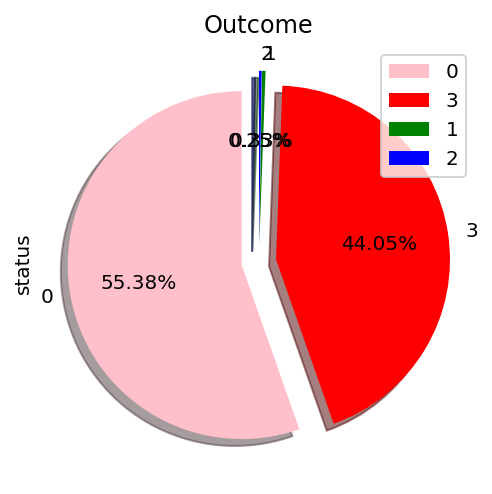

In [9]:
print(df.status.value_counts())
color=['pink','r',"green","blue"]
df['status'].value_counts().plot.pie(colors=color,startangle=90, shadow=True,explode=(0.1, 0.1, 0.1, 0.1), autopct='%1.2f%%').set_title('Outcome')
plt.legend()
plt.show

In [10]:
df.head()

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.065927,88.0,174.0,57.5,39.0,95.5,106.5,20.0,1,0
1,0,8,26.989619,78.0,170.0,57.0,36.5,90.0,100.0,20.0,1,0
2,0,16,23.939481,75.0,177.0,59.0,39.0,88.0,104.0,20.0,1,0
3,0,15,22.129740,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
4,0,15,22.129740,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0


In [11]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
X = df.iloc[:,0:11]  #independent columns
y = df.iloc[:,-1]    #target column i.e price range
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  # naming the dataframe columns
print(featureScores.nlargest(12,'Score'))  # print 10 best features

      Specs        Score
3    Weight  4771.473710
7     Waist  3199.638330
2       BMI  1189.204789
8   Buttock   809.847215
1       ESS   732.408253
6      Neck   665.322042
9       Age   390.301311
10        M   137.170498
4    Height    80.044040
5      Head    29.100049
0        BQ    10.907233


[0.01913294 0.07546474 0.11933075 0.11247844 0.07263733 0.06946427
 0.11897542 0.16927107 0.0930714  0.09213632 0.05803733]


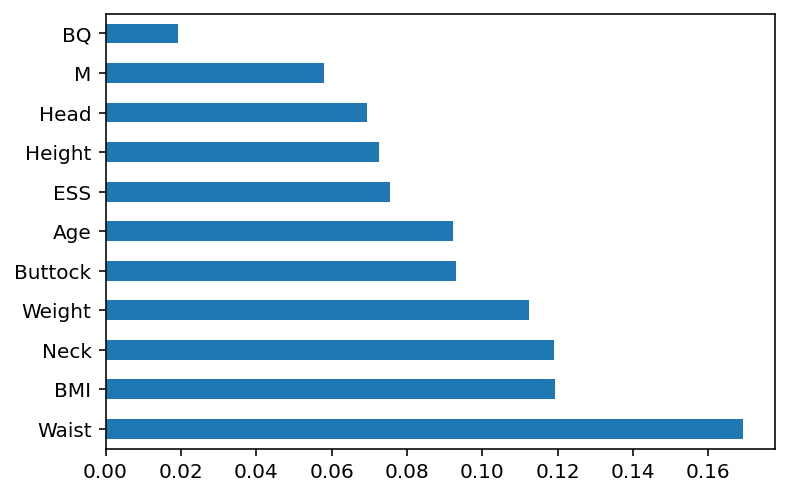

In [12]:
X = df.iloc[:,0:11]  #independent columns
y = df.iloc[:,-1]    #target column i.e price range

from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for  visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

In [13]:
X = df.drop('status', axis=1)   # axis=0 for row, axis=1 for column
y = df['status']

# split data to 80:20 ratio for train/test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2)
print('X_train', X_train.shape)
print('y_train', y_train.shape)
print('X_test', X_test.shape)
print('y_test', y_test.shape)


X_train (4166, 11)
y_train (4166,)
X_test (1042, 11)
y_test (1042,)


In [14]:
def evaluate(model, X_test , y_test,modelname):
  y_pred1=model.predict(X_test)
  accuracy     = accuracy_score(y_test, y_pred1)
  classification=classification_report(y_test,y_pred1)
  confusion    = confusion_matrix(y_test, y_pred1)
  df_model = pd.DataFrame({  'model'        : [modelname],
                             'accuracy'     : [accuracy],
                            'classification':[classification],
                             'timetaken'    : [time2],
                            'confusionmatrix' : [confusion]
                            
                                }) 
  return df_model

In [15]:
%%time
time2=time.time()
print("base model")
base_model = RandomForestClassifier(random_state=0)
base_model.fit(X_train, y_train)
model1 = evaluate(base_model,  X_test,  y_test, 'RandomForest')
model1.timetaken[0] = time.time() - time2
print("Random Forest")
print(base_model.get_params())

model1

base model
Random Forest
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}
CPU times: user 732 ms, sys: 4.5 ms, total: 736 ms
Wall time: 745 ms


,model,accuracy,classification,timetaken,confusionmatrix
0,RandomForest,0.790787,precision recall f1-score ...,0.743616,"[[478, 0, 0, 100], [1, 0, 0, 2], [1, 0, 1, 1],..."


In [16]:
%%time
from sklearn.ensemble import ExtraTreesClassifier

time2=time.time()
print("base model")
base_model1 = ExtraTreesClassifier(random_state=0)
base_model1.fit(X_train, y_train)
model2 = evaluate(base_model1,  X_test,  y_test, 'Extra Tree')
model2.timetaken[0] = time.time() - time2
print("Extra Tree")
print(base_model1.get_params())

model2

base model
Extra Tree
{'bootstrap': False, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}
CPU times: user 506 ms, sys: 20.3 ms, total: 527 ms
Wall time: 546 ms


,model,accuracy,classification,timetaken,confusionmatrix
0,Extra Tree,0.804223,precision recall f1-score ...,0.544872,"[[489, 0, 0, 89], [1, 0, 0, 2], [1, 0, 1, 1], ..."


In [17]:
%%time
time2=time.time()
print("base model")
base_model2 = LogisticRegression(random_state=0)
base_model2.fit(X_train, y_train)
model3 = evaluate(base_model2,  X_test,  y_test, 'Logistic Regression')
model3.timetaken[0] = time.time() - time2
print("Logoistic Regression")
print(base_model2.get_params())

model3

base model
Logoistic Regression
{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 0, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
CPU times: user 212 ms, sys: 957 µs, total: 213 ms
Wall time: 218 ms


,model,accuracy,classification,timetaken,confusionmatrix
0,Logistic Regression,0.764875,precision recall f1-score ...,0.21672,"[[475, 0, 0, 103], [1, 0, 0, 2], [2, 0, 0, 1],..."


In [18]:
%%time
time2=time.time()
print("base model")
base_model3 = KNeighborsClassifier()
base_model3.fit(X_train, y_train)
model4 = evaluate(base_model3,  X_test,  y_test, 'KNN')
model4.timetaken[0] = time.time() - time2
print("KNN")
print(base_model3.get_params())

model4

base model
KNN
{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}
CPU times: user 69.6 ms, sys: 1.28 ms, total: 70.9 ms
Wall time: 75.6 ms


,model,accuracy,classification,timetaken,confusionmatrix
0,KNN,0.758157,precision recall f1-score ...,0.073758,"[[451, 0, 0, 127], [1, 0, 0, 2], [2, 0, 0, 1],..."


In [19]:
%%time
time2=time.time()
print("base model")
base_model4 = LinearSVC(random_state=0)
base_model4.fit(X_train, y_train)
model5 = evaluate(base_model4,  X_test,  y_test, 'LinearSVC')
model5.timetaken[0] = time.time() - time2
print("LinearSVC")
print(base_model4.get_params())

model5

base model
LinearSVC
{'C': 1.0, 'class_weight': None, 'dual': True, 'fit_intercept': True, 'intercept_scaling': 1, 'loss': 'squared_hinge', 'max_iter': 1000, 'multi_class': 'ovr', 'penalty': 'l2', 'random_state': 0, 'tol': 0.0001, 'verbose': 0}
CPU times: user 939 ms, sys: 446 µs, total: 939 ms
Wall time: 946 ms


,model,accuracy,classification,timetaken,confusionmatrix
0,LinearSVC,0.758157,precision recall f1-score ...,0.944355,"[[476, 2, 0, 100], [1, 0, 0, 2], [2, 0, 0, 1],..."


In [20]:
%%time
time2=time.time()
print("base model")
base_model5 = GaussianNB()
base_model5.fit(X_train, y_train)
model6 = evaluate(base_model5,  X_test,  y_test, 'GaussianNB')
model6.timetaken[0] = time.time() - time2
print("GaussianNB")
print(base_model5.get_params())

model6

base model
GaussianNB
{'priors': None, 'var_smoothing': 1e-09}
CPU times: user 18.8 ms, sys: 0 ns, total: 18.8 ms
Wall time: 20.1 ms


,model,accuracy,classification,timetaken,confusionmatrix
0,GaussianNB,0.759117,precision recall f1-score ...,0.018549,"[[455, 0, 0, 123], [0, 0, 0, 3], [2, 0, 0, 1],..."


In [21]:
%%time
time2=time.time()
print("base model")
base_model6=SVC(random_state=0)
base_model6.fit(X_train, y_train)
model7 = evaluate(base_model6,  X_test,  y_test, 'SVC')
model7.timetaken[0] = time.time() - time2
print("SVC")
print(base_model6.get_params())

model7

base model
SVC
{'C': 1.0, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'probability': False, 'random_state': 0, 'shrinking': True, 'tol': 0.001, 'verbose': False}
CPU times: user 696 ms, sys: 50.8 ms, total: 747 ms
Wall time: 752 ms


,model,accuracy,classification,timetaken,confusionmatrix
0,SVC,0.761036,precision recall f1-score ...,0.750707,"[[460, 0, 0, 118], [1, 0, 0, 2], [2, 0, 0, 1],..."


In [22]:
%%time
time2=time.time()
print("base model")
base_model7=DecisionTreeClassifier(random_state=0)
base_model7.fit(X_train, y_train)
model8 = evaluate(base_model7,  X_test,  y_test, 'Decision Tree')
model8.timetaken[0] = time.time() - time2
print("Decision Tree")
print(base_model7.get_params())

model8


base model
Decision Tree
{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 0, 'splitter': 'best'}
CPU times: user 44.1 ms, sys: 0 ns, total: 44.1 ms
Wall time: 50.6 ms


,model,accuracy,classification,timetaken,confusionmatrix
0,Decision Tree,0.758157,precision recall f1-score ...,0.049147,"[[456, 5, 2, 115], [2, 0, 0, 1], [0, 0, 1, 2],..."


In [23]:
df_base= pd.concat([model1,model2,model3,model4,model5,model6,model7,model8],axis = 0).reset_index()
df_base.drop('index', axis=1, inplace=True)
df_base

,model,accuracy,classification,timetaken,confusionmatrix
0,RandomForest,0.790787,precision recall f1-score ...,0.743616,"[[478, 0, 0, 100], [1, 0, 0, 2], [1, 0, 1, 1],..."
1,Extra Tree,0.804223,precision recall f1-score ...,0.544872,"[[489, 0, 0, 89], [1, 0, 0, 2], [1, 0, 1, 1], ..."
2,Logistic Regression,0.764875,precision recall f1-score ...,0.216720,"[[475, 0, 0, 103], [1, 0, 0, 2], [2, 0, 0, 1],..."
3,KNN,0.758157,precision recall f1-score ...,0.073758,"[[451, 0, 0, 127], [1, 0, 0, 2], [2, 0, 0, 1],..."
4,LinearSVC,0.758157,precision recall f1-score ...,0.944355,"[[476, 2, 0, 100], [1, 0, 0, 2], [2, 0, 0, 1],..."
5,GaussianNB,0.759117,precision recall f1-score ...,0.018549,"[[455, 0, 0, 123], [0, 0, 0, 3], [2, 0, 0, 1],..."
6,SVC,0.761036,precision recall f1-score ...,0.750707,"[[460, 0, 0, 118], [1, 0, 0, 2], [2, 0, 0, 1],..."
7,Decision Tree,0.758157,precision recall f1-score ...,0.049147,"[[456, 5, 2, 115], [2, 0, 0, 1], [0, 0, 1, 2],..."


In [24]:
df_base['confusionmatrix']
df_base.to_csv("imbalanced_data_performance_metrics.csv")

In [25]:

#!pip install yellowbrick
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split

#For Visualizers
from yellowbrick.classifier import ClassificationReport
from yellowbrick.classifier import ClassPredictionError
from yellowbrick.classifier import ConfusionMatrix
from yellowbrick.classifier import ROCAUC
from yellowbrick.classifier import PrecisionRecallCurve
import matplotlib.pyplot as plt

#For Metrics
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import hamming_loss
from sklearn.metrics import log_loss
from sklearn.metrics import zero_one_loss
from sklearn.metrics import matthews_corrcoef
#Classifiers
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB 
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.linear_model import LogisticRegression

import warnings
warnings.filterwarnings('ignore')

In [26]:
classes = ["Normal", "Mild","Moderate","Severe"]
classes

['Normal', 'Mild', 'Moderate', 'Severe']

In [27]:
classifiers=[
DecisionTreeClassifier(random_state=0),
SVC(random_state=0),
LinearSVC(random_state=0),
GaussianNB(),
KNeighborsClassifier(),
LogisticRegression(random_state=0),
RandomForestClassifier(random_state=0),
ExtraTreesClassifier(random_state=0)]


In [28]:
#for class-centric metrics
# Classification report
def CR_viz():
    def Class_report(model,classes):
        visualizer = ClassificationReport(model, classes=classes, support=True)
        visualizer.fit(X_train, y_train)  # Fit the model
        
        visualizer.score(X_test, y_test)
        
        return visualizer.poof()
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        Class_report(name,classes)

#Class Prediction Error :
def CPE_viz():    
    def CPE(model,classes):
        visualizer = ClassPredictionError(model, classes=classes)
        visualizer.fit(X_train, y_train)  
        
        visualizer.score(X_test, y_test)
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        CPE(name,classes)
        
#Confusion matrix
def CM_viz():    
    def CM(model,classes):
        visualizer = ConfusionMatrix(model, classes=classes,percent=True)
        visualizer.fit(X_train, y_train)  
        visualizer.score(X_test, y_test)
        
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        CM(name,classes)
        
#ROC-AUC
def ROC_viz():    
    def ROC(model,classes):
        visualizer = ROCAUC(model, classes=classes)
        visualizer.fit(X_train, y_train) 
        
        visualizer.score(X_test, y_test)
        
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        ROC(name,classes)

#Precision Recall Curve
def PRC_viz():  
    def PRC(model,classes):
        visualizer = PrecisionRecallCurve(model,classes=classes, per_class=True, iso_f1_curves=False,
    fill_area=False, micro=False)
        visualizer.fit(X_train, y_train) 
        visualizer.score(X_test, y_test)
      
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        PRC(name,classes)


In [29]:
# for aggregate metrics
def classifier_metrics():    
    def metrics(model):
        
        model.fit(X_train, y_train)  
        y_pred = model.predict(X_test)
        try: 
            y_prob = model.predict_proba(X_test)
            log_metric = log_loss(y_test,y_prob)
        except:
            y_prob = "Not probablistic"
            log_metric = 0
        else:
            y_pred = model.predict(X_test)
        c_k_s=cohen_kappa_score(y_test,y_pred)
        zero_met=zero_one_loss(y_test,y_pred)
        hl=hamming_loss(y_test,y_pred)
        mc=matthews_corrcoef(y_test,y_pred)
        print('cohen_kappa_score: {0:.3f}'.format(c_k_s))
        print('log_loss: {0:.3f}'.format(log_metric))
        print('zero_one_loss: {0:.3f}'.format(zero_met))
        print('hemming_loss: {0:.3f}'.format(hl))
        print('matthews_corrcoef: {0:.3f}'.format(mc))
    for name in classifiers:
        print (str(name))
        metrics(name)
        print()
        print ("----------------------------------------")

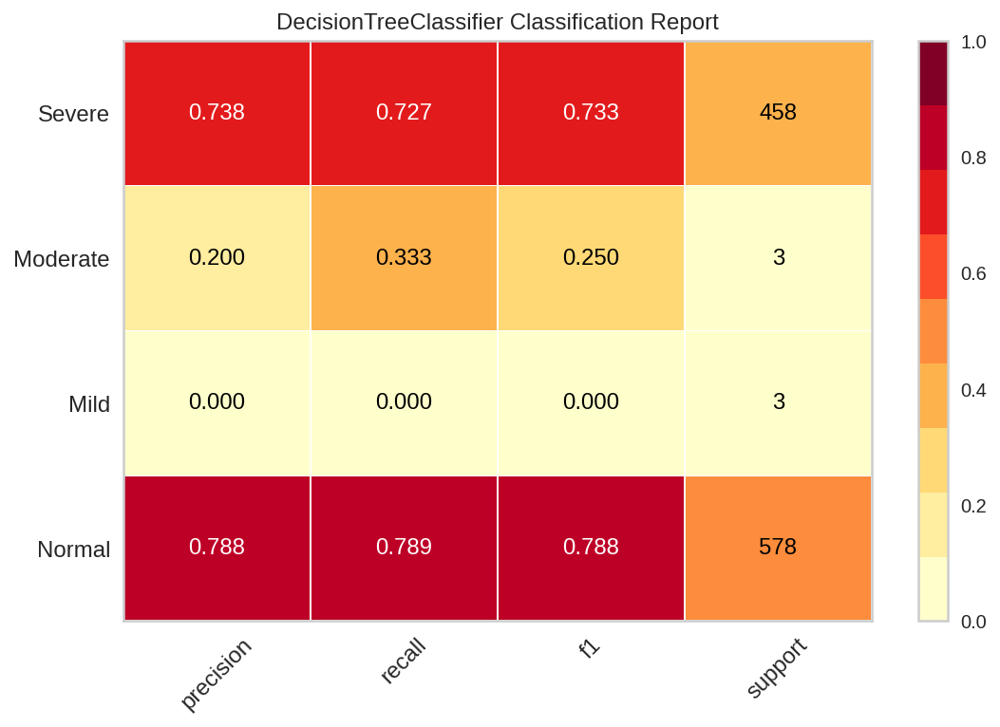

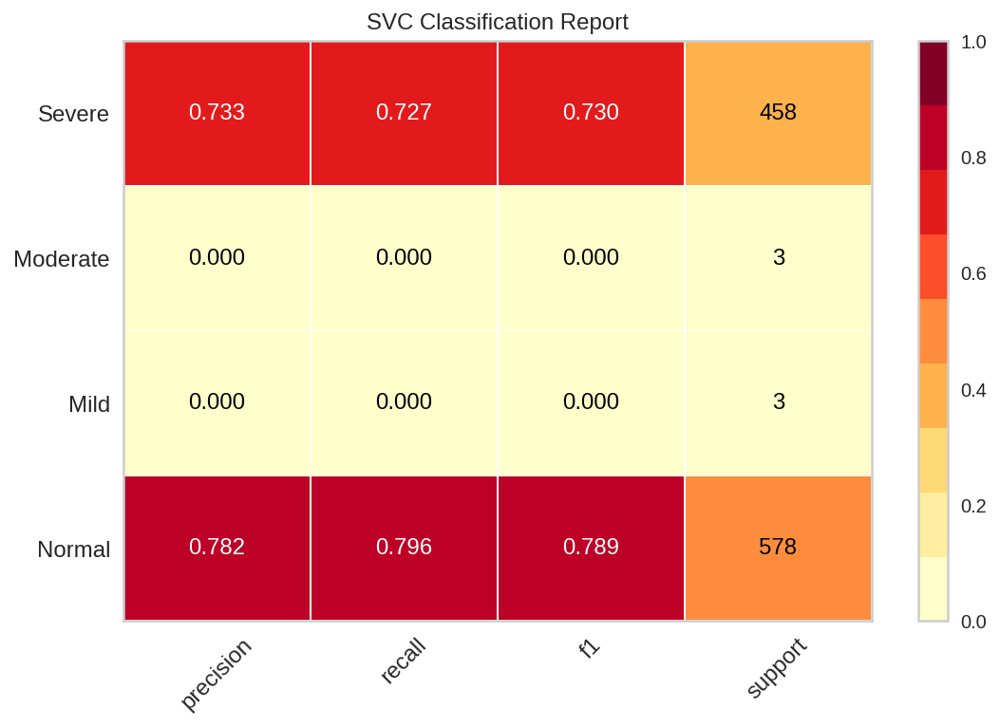

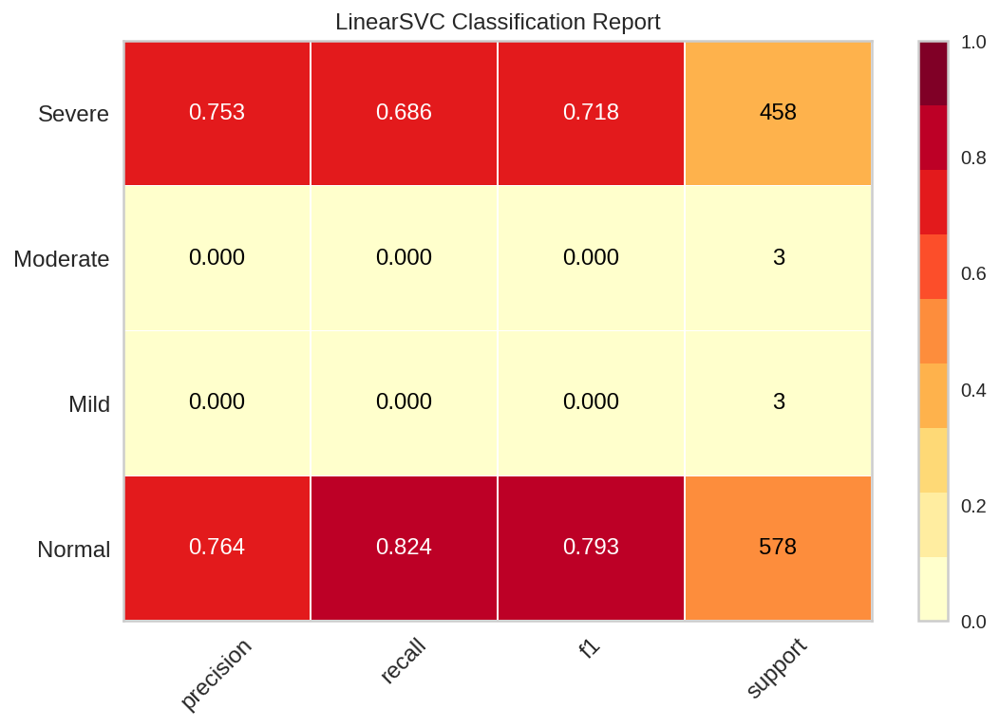

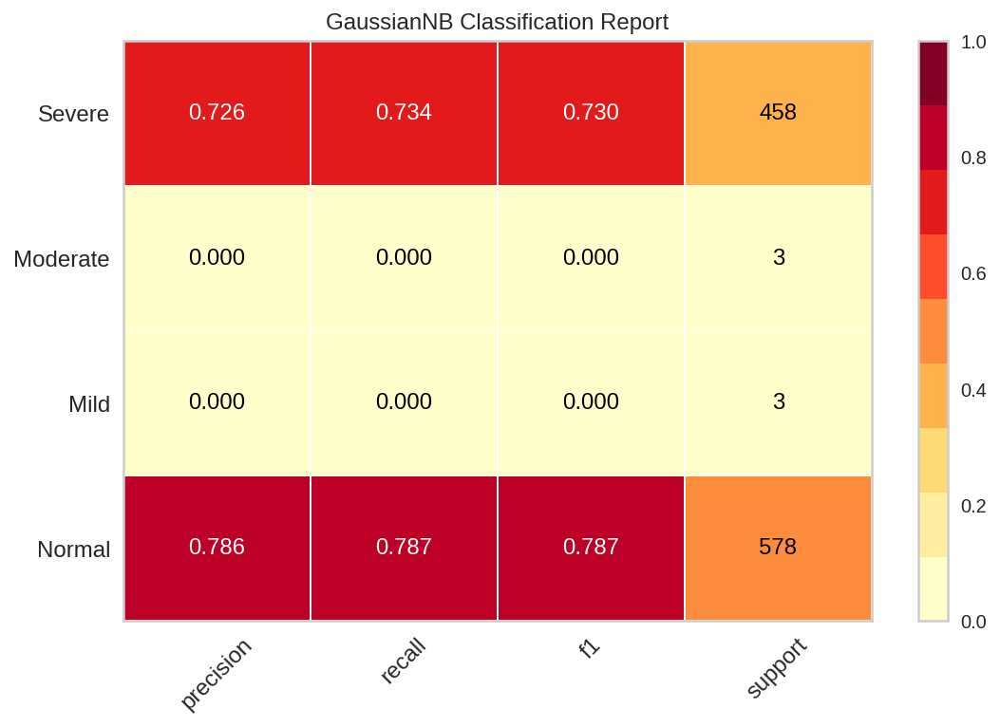

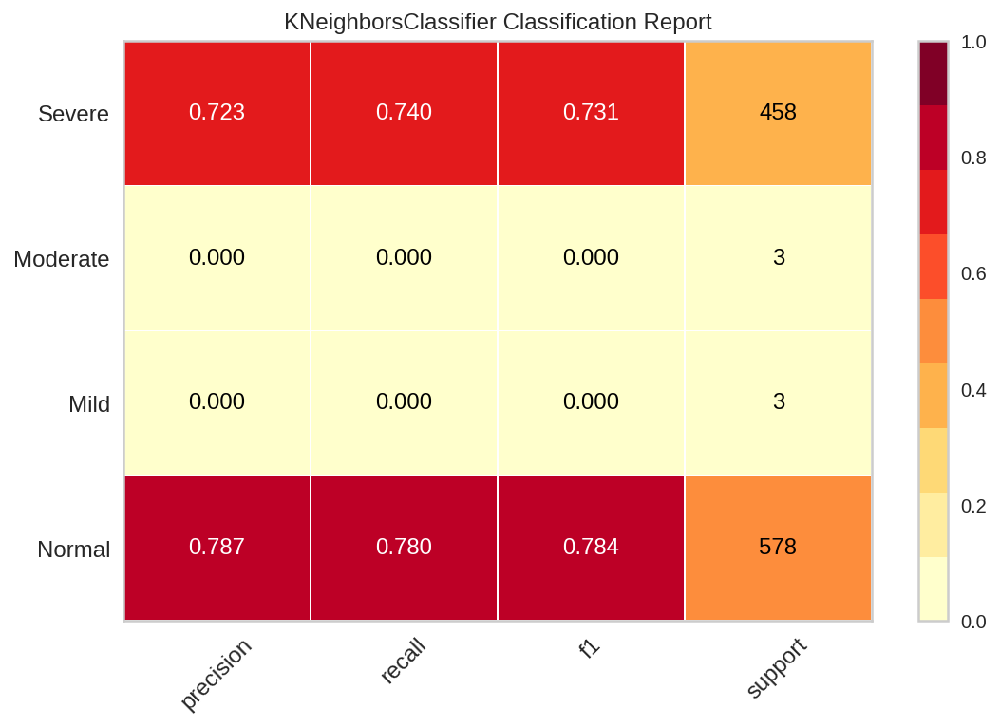

...

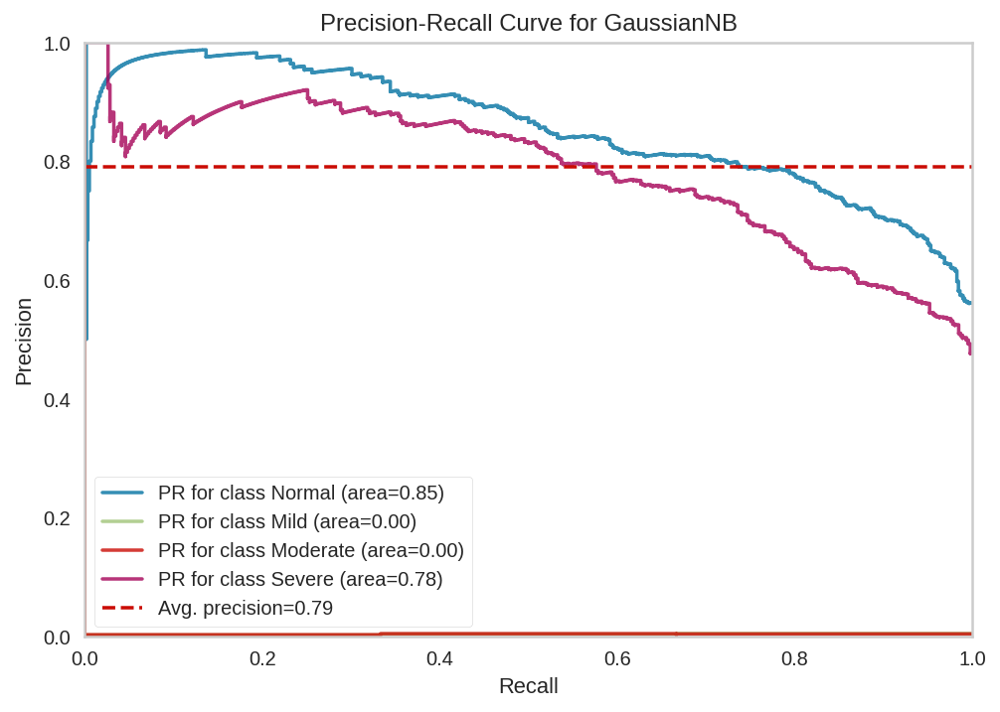

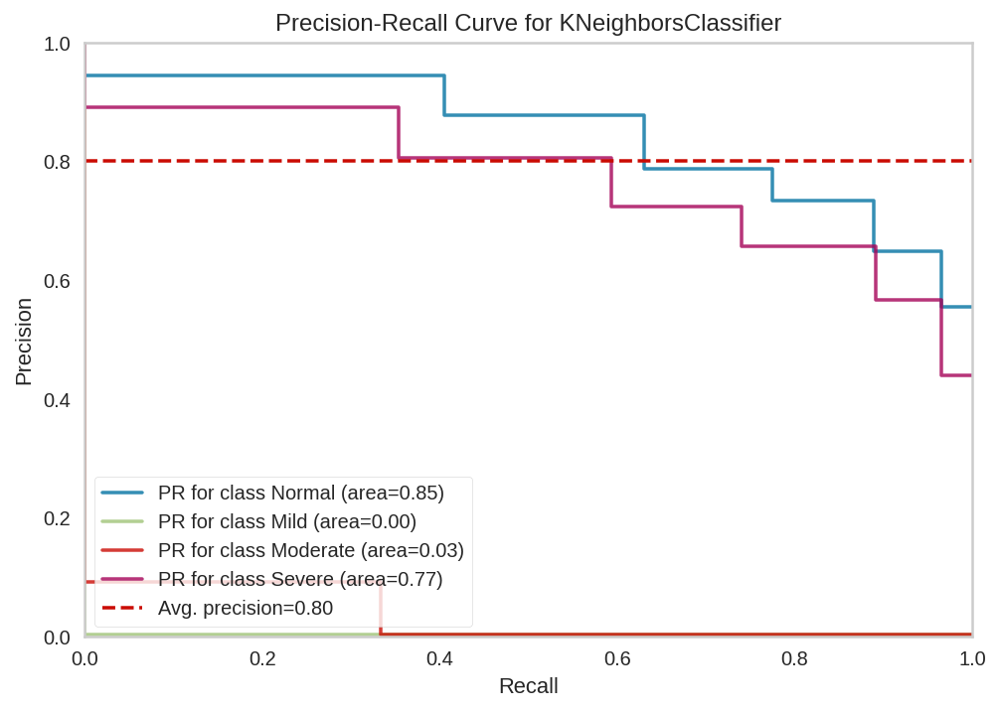

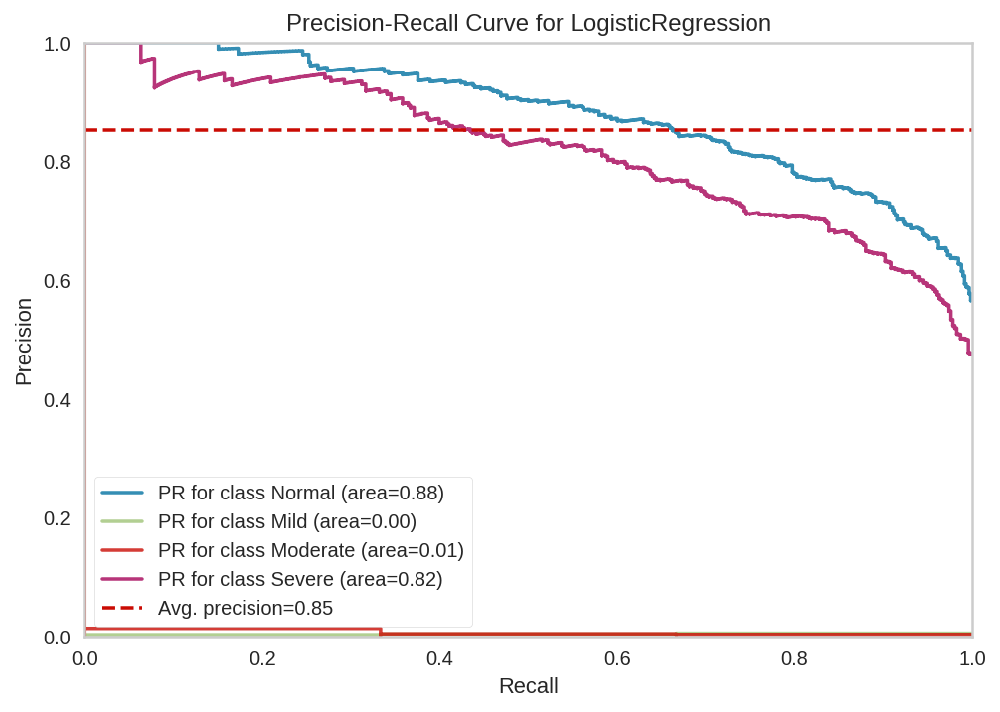

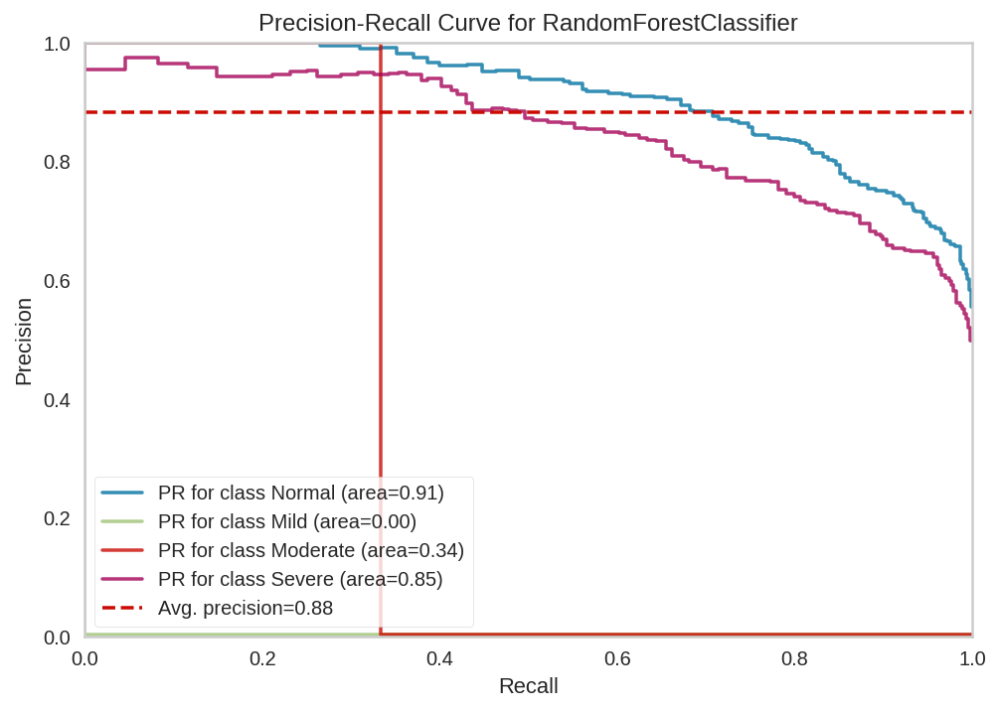

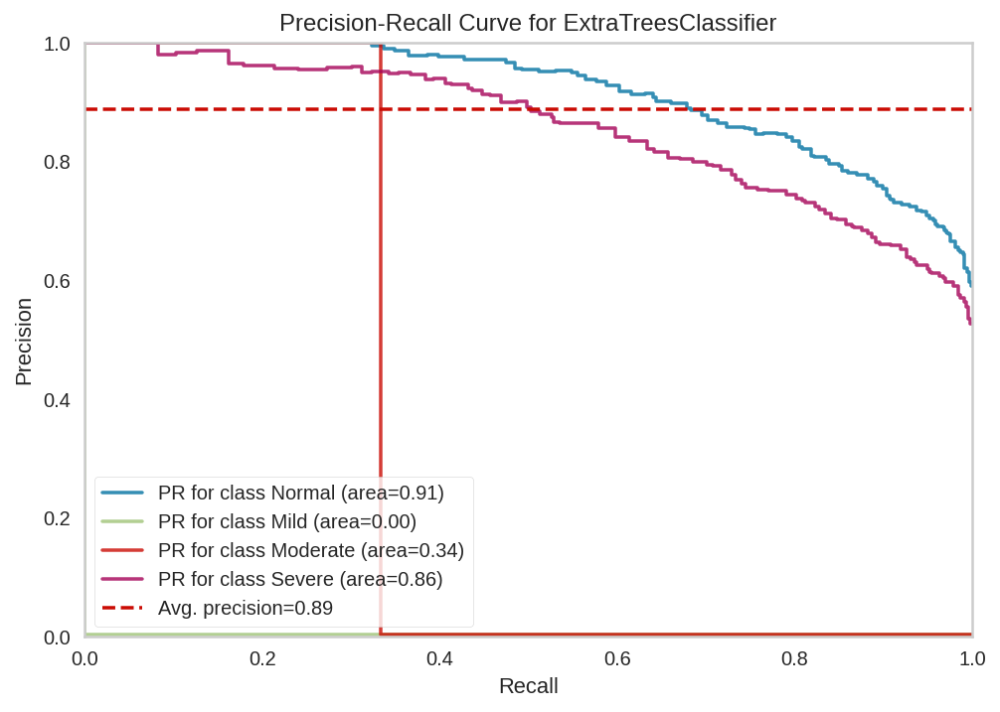

In [30]:
#Print visualization
visualization =[CR_viz(),CPE_viz(),CM_viz(),ROC_viz(),PRC_viz()]

In [31]:
#Print aggregate metrics  
classifier_metrics()

DecisionTreeClassifier(random_state=0)
cohen_kappa_score: 0.518
log_loss: 8.353
zero_one_loss: 0.242
hemming_loss: 0.242
matthews_corrcoef: 0.518

----------------------------------------
SVC(random_state=0)
cohen_kappa_score: 0.518
log_loss: 0.000
zero_one_loss: 0.239
hemming_loss: 0.239
matthews_corrcoef: 0.518

----------------------------------------
LinearSVC(random_state=0)
cohen_kappa_score: 0.509
log_loss: 0.000
zero_one_loss: 0.242
hemming_loss: 0.242
matthews_corrcoef: 0.511

----------------------------------------
GaussianNB()
cohen_kappa_score: 0.515
log_loss: 1.079
zero_one_loss: 0.241
hemming_loss: 0.241
matthews_corrcoef: 0.515

----------------------------------------
KNeighborsClassifier()
cohen_kappa_score: 0.514
log_loss: 1.725
zero_one_loss: 0.242
hemming_loss: 0.242
matthews_corrcoef: 0.514

----------------------------------------
LogisticRegression(random_state=0)
cohen_kappa_score: 0.523
log_loss: 0.506
zero_one_loss: 0.235
hemming_loss: 0.235
matthews_corrcoef

### **IMBLANCED TO BALANCED DATSET**

> Indented block



#### CASE-1

In [32]:
X = df.drop('status', axis=1)   # axis=0 for row, axis=1 for column
y = df['status']
y

0       0
1       0
2       0
3       0
4       0
       ..
5203    3
5204    3
5205    3
5206    3
5207    0
Name: status, Length: 5208, dtype: int64

###** OVERSAMPLING**

In [33]:
from imblearn.over_sampling import SMOTE
strategy = {0:2884, 1:2200, 2:2200, 3:2294}
oversample = SMOTE(sampling_strategy=strategy)
X, y = oversample.fit_resample(X, y)

In [34]:
y
unique, counts = np.unique(y, return_counts=True)
dict(zip(unique, counts))

{0: 2884, 1: 2200, 2: 2200, 3: 2294}

Text(0, 0.5, 'Frequency')

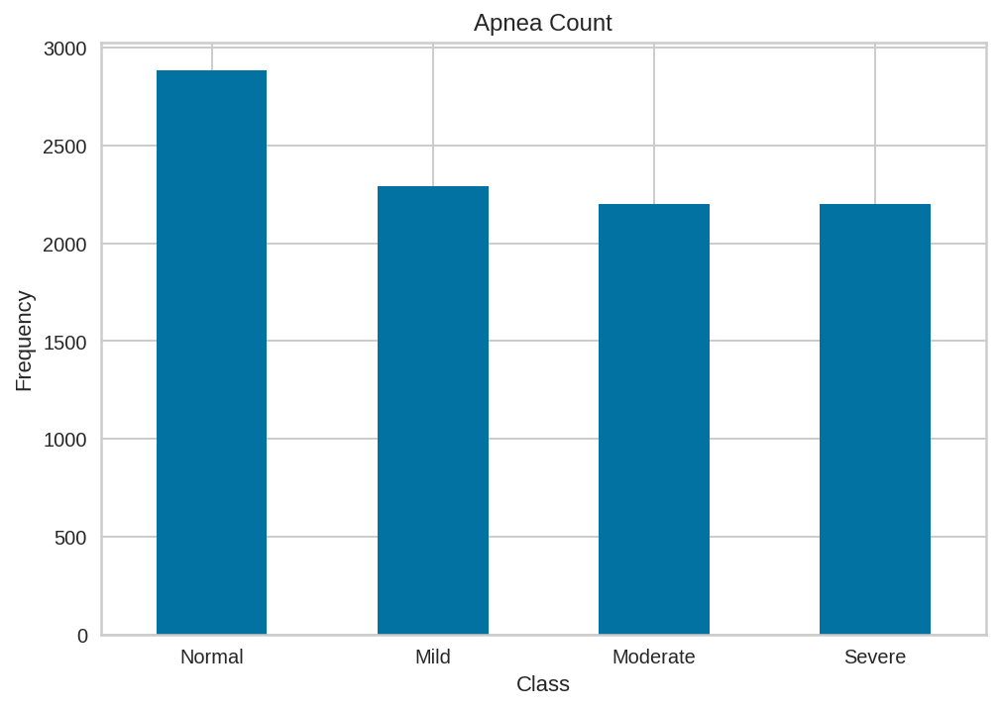

In [35]:
LABELS = ["Normal", "Mild","Moderate","Severe"]

count_classes = pd.value_counts(y, sort = True)

count_classes.plot(kind = 'bar', rot=0)

plt.title("Apnea Count")

plt.xticks(range(4), LABELS)

plt.xlabel("Class")

plt.ylabel("Frequency")

0    2884
3    2294
2    2200
1    2200
Name: status, dtype: int64


<function matplotlib.pyplot.show(*args, **kw)>

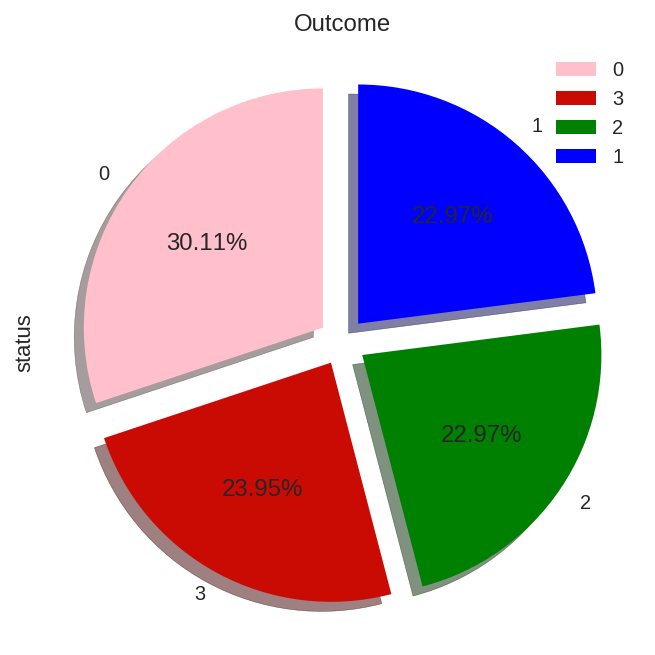

In [36]:
print(y.value_counts())
color=['pink',"r","green","blue"]
y.value_counts().plot.pie(colors=color,startangle=90, shadow=True,explode=(0.1, 0.1, 0.1, 0.1), autopct='%1.2f%%').set_title('Outcome')
plt.legend()
plt.show

In [37]:
X.shape

(9578, 11)

In [38]:
X

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M
0,0,14,29.065927,88.000000,174.000000,57.500000,39.000000,95.500000,106.500000,20.000000,1
1,0,8,26.989619,78.000000,170.000000,57.000000,36.500000,90.000000,100.000000,20.000000,1
2,0,16,23.939481,75.000000,177.000000,59.000000,39.000000,88.000000,104.000000,20.000000,1
3,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1
4,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1
...,...,...,...,...,...,...,...,...,...,...,...
9573,0,13,24.598765,65.457415,163.111701,55.888299,37.106395,87.941497,98.457415,60.882993,0
9574,0,14,26.069198,69.531585,163.296890,55.703110,35.624878,87.015549,102.531585,59.031098,0
9575,0,14,24.839035,65.994832,163.000000,57.331037,38.000000,88.167241,94.668963,57.341372,1
9576,0,3,24.294434,70.558261,170.604348,56.972087,36.709348,84.744565,99.709348,27.814348,1


In [39]:
y

0       0
1       0
2       0
3       0
4       0
       ..
9573    2
9574    2
9575    2
9576    2
9577    2
Name: status, Length: 9578, dtype: int64

In [40]:
df1 = pd.concat([X,y],axis='columns')
df1

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.065927,88.000000,174.000000,57.500000,39.000000,95.500000,106.500000,20.000000,1,0
1,0,8,26.989619,78.000000,170.000000,57.000000,36.500000,90.000000,100.000000,20.000000,1,0
2,0,16,23.939481,75.000000,177.000000,59.000000,39.000000,88.000000,104.000000,20.000000,1,0
3,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1,0
4,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9573,0,13,24.598765,65.457415,163.111701,55.888299,37.106395,87.941497,98.457415,60.882993,0,2
9574,0,14,26.069198,69.531585,163.296890,55.703110,35.624878,87.015549,102.531585,59.031098,0,2
9575,0,14,24.839035,65.994832,163.000000,57.331037,38.000000,88.167241,94.668963,57.341372,1,2
9576,0,3,24.294434,70.558261,170.604348,56.972087,36.709348,84.744565,99.709348,27.814348,1,2


In [41]:
df1=df1.round({'BQ' : 0,'ESS' : 0,'BMI' : 5,'Weight' : 0,'Height' : 0,'Head' : 1,'Neck' : 0,'Waist' : 0,'Buttock' : 0,'Age' : 0,'M' : 0,'status' : 0,})

In [42]:
df1

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.06593,88.0,174.0,57.5,39.0,96.0,106.0,20.0,1,0
1,0,8,26.98962,78.0,170.0,57.0,36.0,90.0,100.0,20.0,1,0
2,0,16,23.93948,75.0,177.0,59.0,39.0,88.0,104.0,20.0,1,0
3,0,15,22.12974,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
4,0,15,22.12974,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9573,0,13,24.59876,65.0,163.0,55.9,37.0,88.0,98.0,61.0,0,2
9574,0,14,26.06920,70.0,163.0,55.7,36.0,87.0,103.0,59.0,0,2
9575,0,14,24.83904,66.0,163.0,57.3,38.0,88.0,95.0,57.0,1,2
9576,0,3,24.29443,71.0,171.0,57.0,37.0,85.0,100.0,28.0,1,2


In [43]:
df1.to_csv('sampled_dataset.csv')
df1.shape

(9578, 12)

In [44]:
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
df1scores = pd.DataFrame(fit.scores_)
df1columns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #name the dataframe columns
print(featureScores.nlargest(12,'Score'))  #print 10 best features

      Specs        Score
3    Weight  4771.473710
7     Waist  3199.638330
2       BMI  1189.204789
8   Buttock   809.847215
1       ESS   732.408253
6      Neck   665.322042
9       Age   390.301311
10        M   137.170498
4    Height    80.044040
5      Head    29.100049
0        BQ    10.907233


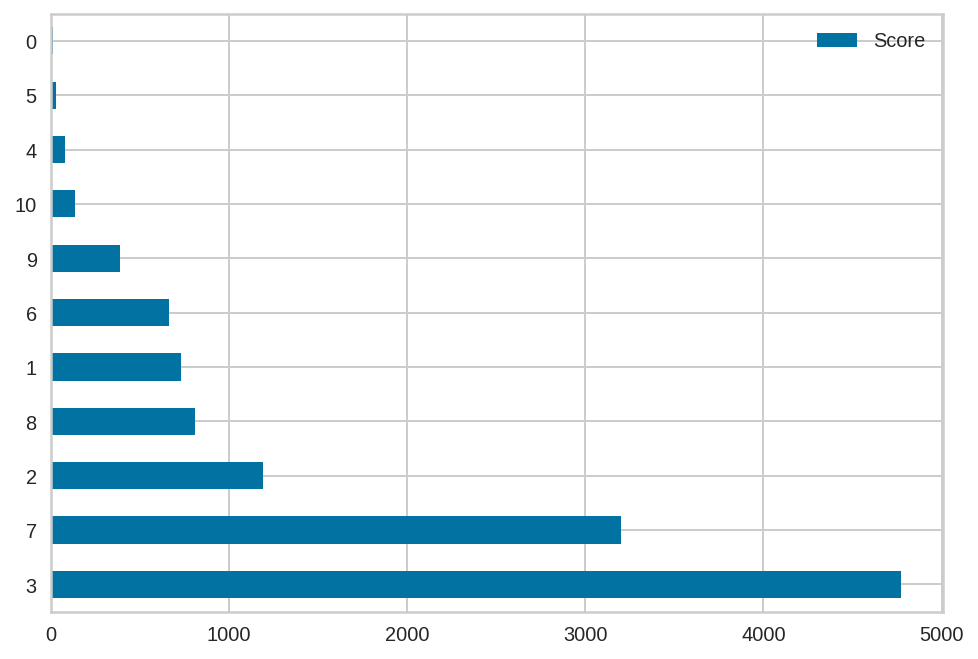

In [45]:
featureScores.nlargest(12,'Score').plot(kind='barh')
plt.show()

[0.02902677 0.09391649 0.09774731 0.09354234 0.09846415 0.09530169
 0.10446533 0.13121931 0.0859187  0.12608696 0.04431095]


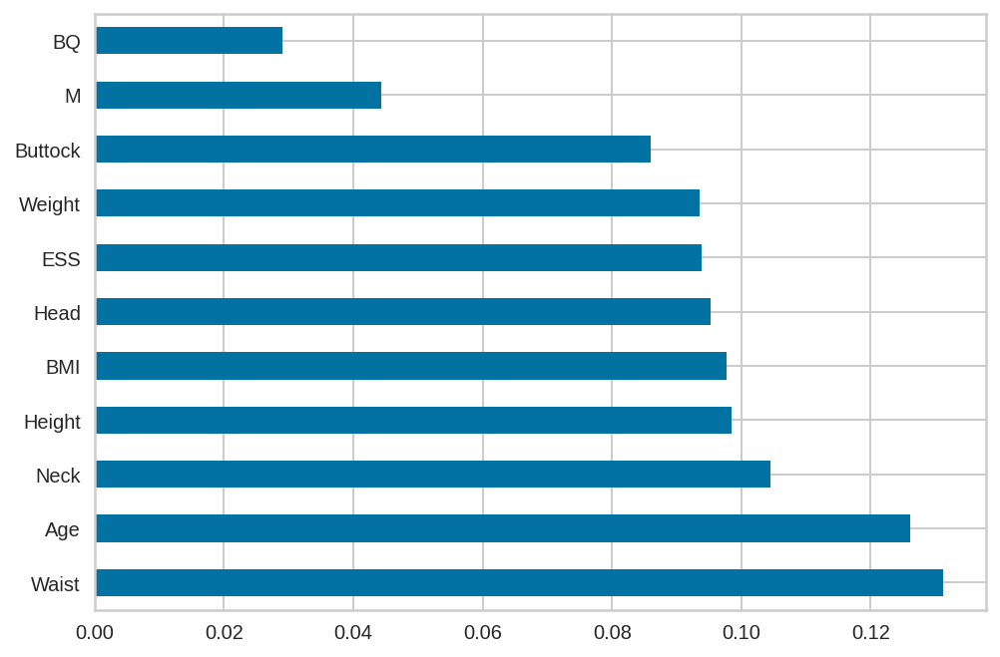

In [46]:
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

In [47]:
X = df1.drop('status', axis=1)   # axis=0 for row, axis=1 for column
y = df1['status']
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2)
print('X_train', X_train.shape)
print('y_train', y_train.shape)
print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (7662, 11)
y_train (7662,)
X_test (1916, 11)
y_test (1916,)


In [48]:
def evaluate(model, X_test , y_test,modelname):
  y_pred1=model.predict(X_test)
  accuracy     = accuracy_score(y_test, y_pred1)
  classification =classification_report(y_test, y_pred1)
  confusion    = confusion_matrix(y_test, y_pred1)

  df_model1 = pd.DataFrame({  'model'        : [modelname],
                             'accuracy'     : [accuracy],
                            'classification':[classification],
                             'timetaken'    : [time2],
                            'confusionmatrix' : [confusion]
                            
                                }) 
  return df_model1

In [49]:
%%time
time2=time.time()
print("base model")
base_model = RandomForestClassifier(random_state=0)
base_model.fit(X_train, y_train)
model1 = evaluate(base_model,  X_test,  y_test, 'RandomForest')
model1.timetaken[0] = time.time() - time2
print("Random Forest")
print(base_model.get_params())
print(model1)

base model
Random Forest
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}
          model  accuracy                                     classification  \
0  RandomForest  0.884134                precision    recall  f1-score   ...   

   timetaken                                    confusionmatrix  
0   1.551015  [[491, 4, 7, 82], [1, 464, 0, 0], [0, 0, 409, ...  
CPU times: user 1.52 s, sys: 4.87 ms, total: 1.52 s
Wall time: 1.56 s


In [50]:
%%time
from sklearn.ensemble import ExtraTreesClassifier

time2=time.time()
print("base model")
base_model1 = ExtraTreesClassifier(random_state=0)
base_model1.fit(X_train, y_train)
model2 = evaluate(base_model1,  X_test,  y_test, 'Extra Tree')
model2.timetaken[0] = time.time() - time2
print("Extra Tree")
print(base_model1.get_params())

base model
Extra Tree
{'bootstrap': False, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}
CPU times: user 744 ms, sys: 4.66 ms, total: 749 ms
Wall time: 757 ms


In [51]:
%%time
time2=time.time()
print("base model")
base_model2 = LogisticRegression(random_state=0)
base_model2.fit(X_train, y_train)
model3 = evaluate(base_model2,  X_test,  y_test, 'Logistic Regression')
model3.timetaken[0] = time.time() - time2
print("Logoistic Regression")
print(base_model2.get_params())

base model
Logoistic Regression
{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 0, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
CPU times: user 571 ms, sys: 454 ms, total: 1.02 s
Wall time: 1.01 s


In [52]:
%%time
time2=time.time()
print("base model")
base_model3 = KNeighborsClassifier()
base_model3.fit(X_train, y_train)
model4 = evaluate(base_model3,  X_test,  y_test, 'KNN')
model4.timetaken[0] = time.time() - time2
print("KNN")
print(base_model3.get_params())
print(X_train.shape)

base model
KNN
{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}
(7662, 11)
CPU times: user 164 ms, sys: 17.8 ms, total: 182 ms
Wall time: 185 ms


In [53]:
%%time
time2=time.time()
print("base model")
base_model4 = LinearSVC(random_state=0)
base_model4.fit(X_train, y_train)
model5 = evaluate(base_model4,  X_test,  y_test, 'LinearSVC')
model5.timetaken[0] = time.time() - time2
print("LinearSVC")
print(base_model4.get_params())

base model
LinearSVC
{'C': 1.0, 'class_weight': None, 'dual': True, 'fit_intercept': True, 'intercept_scaling': 1, 'loss': 'squared_hinge', 'max_iter': 1000, 'multi_class': 'ovr', 'penalty': 'l2', 'random_state': 0, 'tol': 0.0001, 'verbose': 0}
CPU times: user 2.39 s, sys: 1.72 ms, total: 2.39 s
Wall time: 2.41 s


In [54]:
%%time
time2=time.time()
print("base model")
base_model5 = GaussianNB()
base_model5.fit(X_train, y_train)
model6 = evaluate(base_model5,  X_test,  y_test, 'GaussianNB')
model6.timetaken[0] = time.time() - time2
print("GaussianNB")
print(base_model5.get_params())

base model
GaussianNB
{'priors': None, 'var_smoothing': 1e-09}
CPU times: user 28.8 ms, sys: 1.95 ms, total: 30.7 ms
Wall time: 30.8 ms


In [55]:
%%time
time2=time.time()
print("base model")
base_model6=SVC(random_state=0)
base_model6.fit(X_train, y_train)
model7 = evaluate(base_model6,  X_test,  y_test, 'SVC')
model7.timetaken[0] = time.time() - time2
print("SVC")
print(base_model6.get_params())

base model
SVC
{'C': 1.0, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'probability': False, 'random_state': 0, 'shrinking': True, 'tol': 0.001, 'verbose': False}
CPU times: user 3.93 s, sys: 750 µs, total: 3.93 s
Wall time: 3.94 s


In [56]:
%%time
time2=time.time()
print("base model")
base_model7=DecisionTreeClassifier(random_state=0)
base_model7.fit(X_train, y_train)
model8 = evaluate(base_model7,  X_test,  y_test, 'Decision Tree')
model8.timetaken[0] = time.time() - time2
print("Decision Tree")
print(base_model7.get_params())

base model
Decision Tree
{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 0, 'splitter': 'best'}
CPU times: user 64.9 ms, sys: 2.41 ms, total: 67.4 ms
Wall time: 67.7 ms


In [57]:
df_base1= pd.concat([model1,model2,model3,model4,model5,model6,model7,model8],axis = 0).reset_index()
df_base1.drop('index', axis=1, inplace=True)
df_base1

,model,accuracy,classification,timetaken,confusionmatrix
0,RandomForest,0.884134,precision recall f1-score ...,1.551015,"[[491, 4, 7, 82], [1, 464, 0, 0], [0, 0, 409, ..."
1,Extra Tree,0.879958,precision recall f1-score ...,0.754573,"[[485, 5, 5, 89], [1, 464, 0, 0], [0, 0, 409, ..."
2,Logistic Regression,0.493215,precision recall f1-score ...,1.009129,"[[258, 133, 87, 106], [197, 194, 42, 32], [167..."
3,KNN,0.802714,precision recall f1-score ...,0.182040,"[[364, 70, 46, 104], [0, 464, 1, 0], [0, 0, 40..."
4,LinearSVC,0.318894,precision recall f1-score ...,2.411525,"[[582, 2, 0, 0], [459, 6, 0, 0], [409, 0, 0, 0..."
5,GaussianNB,0.554802,precision recall f1-score ...,0.028373,"[[201, 215, 78, 90], [54, 366, 36, 9], [70, 10..."
6,SVC,0.544363,precision recall f1-score ...,3.933814,"[[221, 170, 107, 86], [66, 265, 106, 28], [42,..."
7,Decision Tree,0.818372,precision recall f1-score ...,0.066221,"[[404, 28, 11, 141], [13, 449, 2, 1], [4, 1, 4..."


In [59]:
df_base1
df_base1.to_csv('Balanced_data1_performance_metrics.csv') #make excel file of Balanced_data1_performance_metrics.csv

In [60]:

#!pip install yellowbrick
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split

#Visualizers
from yellowbrick.classifier import ClassificationReport
from yellowbrick.classifier import ClassPredictionError
from yellowbrick.classifier import ConfusionMatrix
from yellowbrick.classifier import ROCAUC
from yellowbrick.classifier import PrecisionRecallCurve
import matplotlib.pyplot as plt

#Metrics
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import hamming_loss
from sklearn.metrics import log_loss
from sklearn.metrics import zero_one_loss
from sklearn.metrics import matthews_corrcoef
#Classifiers
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB 
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.linear_model import LogisticRegression

import warnings
warnings.filterwarnings('ignore')

In [61]:
classes =  ["Normal", "Mild","Moderate","Severe"]
classes

['Normal', 'Mild', 'Moderate', 'Severe']

In [62]:
classifiers=[
DecisionTreeClassifier(random_state=0),
SVC(random_state=0),
LinearSVC(random_state=0),
GaussianNB(),
KNeighborsClassifier(),
LogisticRegression(random_state=0),
RandomForestClassifier(random_state=0),
ExtraTreesClassifier(random_state=0)]


In [63]:
# for class-centric metrics
# Classification report:
def CR_viz():
    def Class_report(model,classes):
        visualizer = ClassificationReport(model, classes=classes, support=True)
        visualizer.fit(X_train, y_train)  
       
        visualizer.score(X_test, y_test)
        return visualizer.poof()
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        Class_report(name,classes)

#Class Prediction Error :
def CPE_viz():    
    def CPE(model,classes):
        visualizer = ClassPredictionError(model, classes=classes)
        visualizer.fit(X_train, y_train)   
        visualizer.score(X_test, y_test)
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        CPE(name,classes)
        
#Confusion matrix :
def CM_viz():    
    def CM(model,classes):
        visualizer = ConfusionMatrix(model, classes=classes,percent=True)
        visualizer.fit(X_train, y_train)   
        visualizer.score(X_test, y_test)
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        CM(name,classes)
        
#ROC-AUC :
def ROC_viz():    
    def ROC(model,classes):
        visualizer = ROCAUC(model, classes=classes)
        visualizer.fit(X_train, y_train)  
        
        visualizer.score(X_test, y_test)
         
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        ROC(name,classes)

#Precision Recall Curve :
def PRC_viz():  
    def PRC(model,classes):
        visualizer = PrecisionRecallCurve(model,classes=classes, per_class=True, iso_f1_curves=False,
    fill_area=False, micro=False)
        visualizer.fit(X_train, y_train)  
        visualizer.score(X_test, y_test)
       
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        PRC(name,classes)


In [64]:
# for aggregate metrics
def classifier_metrics():    
    def metrics(model):
     
        model.fit(X_train, y_train) 
        y_pred = model.predict(X_test)
        try: 
            y_prob = model.predict_proba(X_test)
            log_metric = log_loss(y_test,y_prob)
        except:
            y_prob = "Not probablistic"
            log_metric = 0
        else:
            y_pred = model.predict(X_test)
        c_k_s=cohen_kappa_score(y_test,y_pred)
        zero_met=zero_one_loss(y_test,y_pred)
        hl=hamming_loss(y_test,y_pred)
        mc=matthews_corrcoef(y_test,y_pred)
        print('cohen_kappa_score: {0:.3f}'.format(c_k_s))
        print('log_loss: {0:.3f}'.format(log_metric))
        print('zero_one_loss: {0:.3f}'.format(zero_met))
        print('hemming_loss: {0:.3f}'.format(hl))
        print('matthews_corrcoef: {0:.3f}'.format(mc))
    for name in classifiers:
        print (str(name))
        metrics(name)
        print()
        print ("--------------------------------------------")

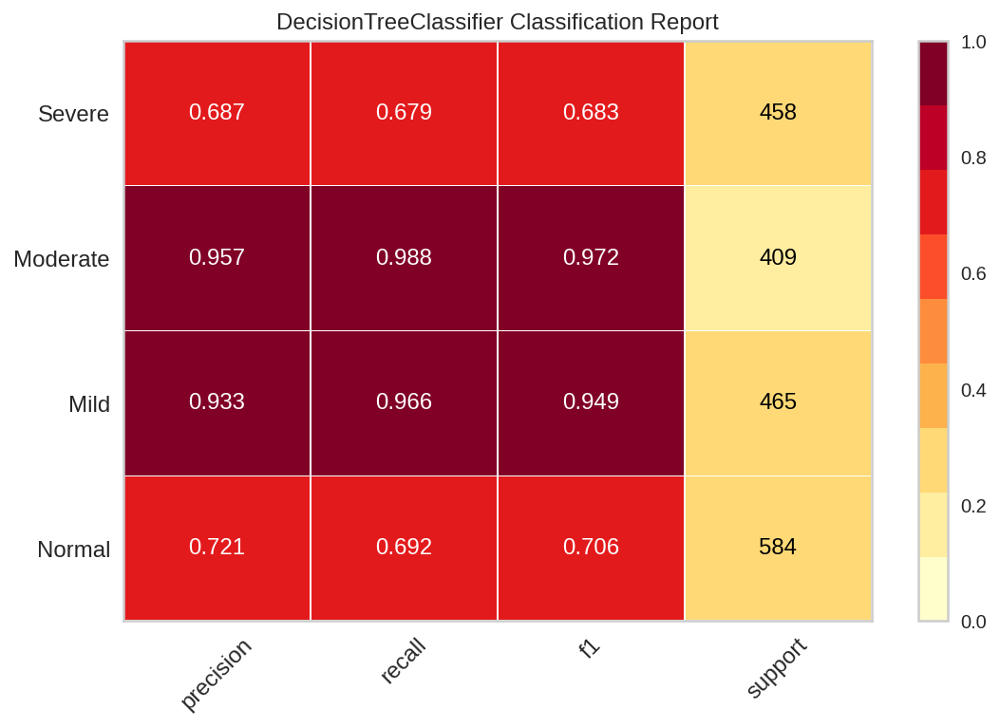

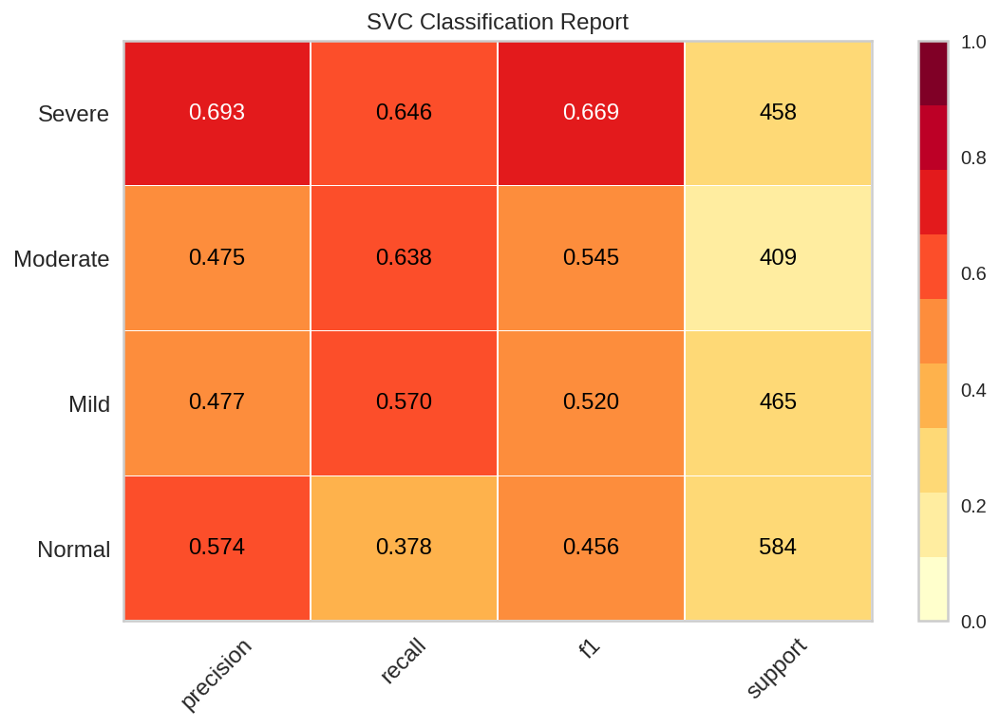

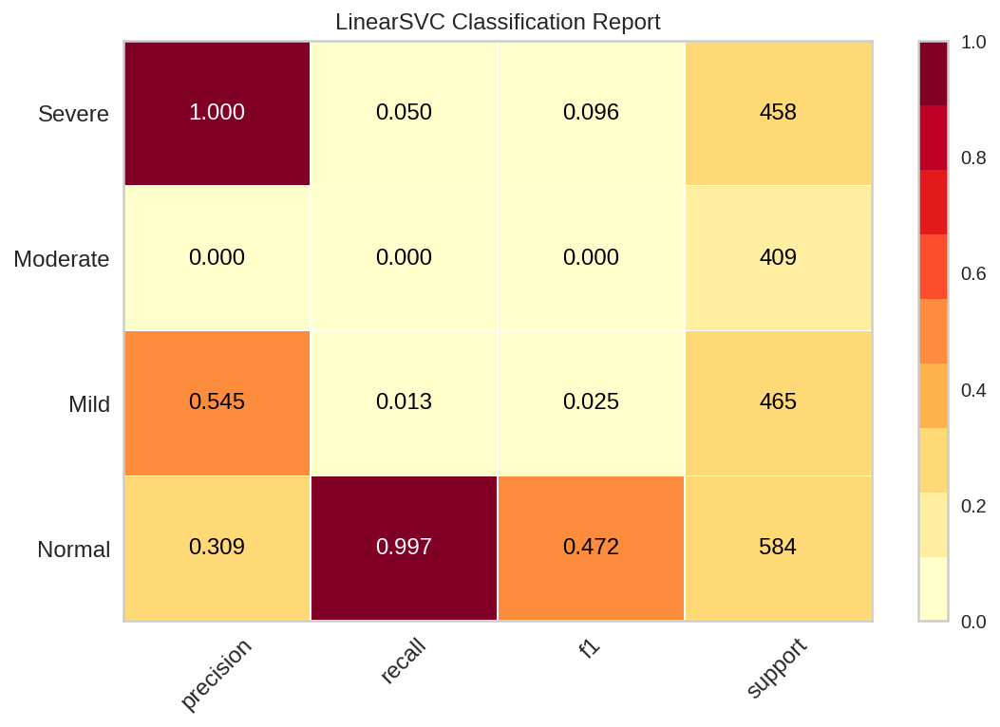

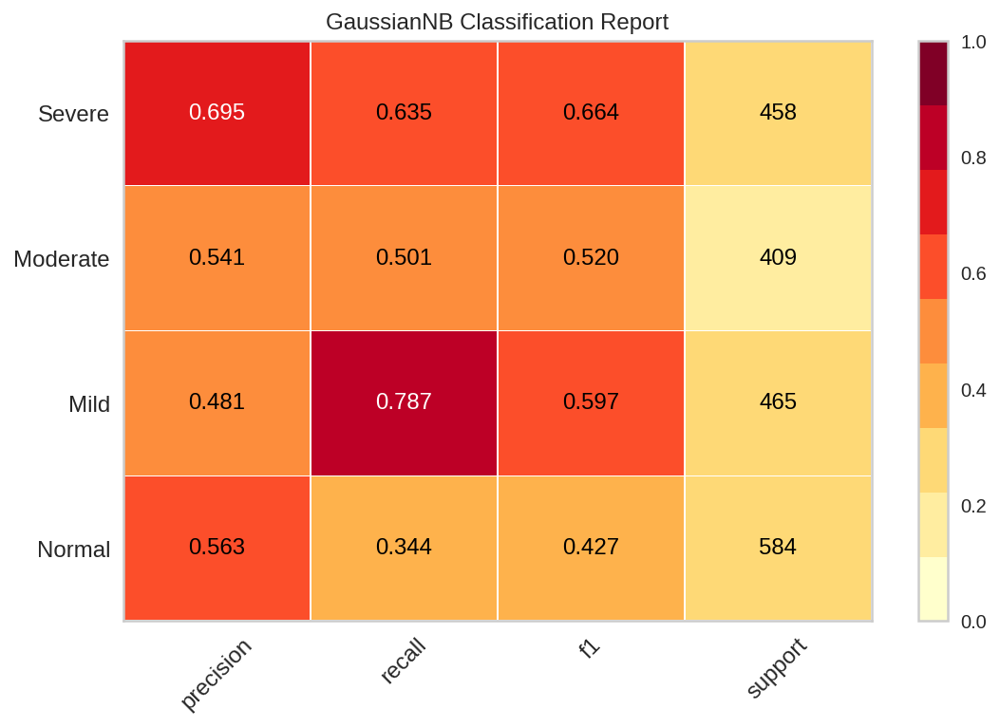

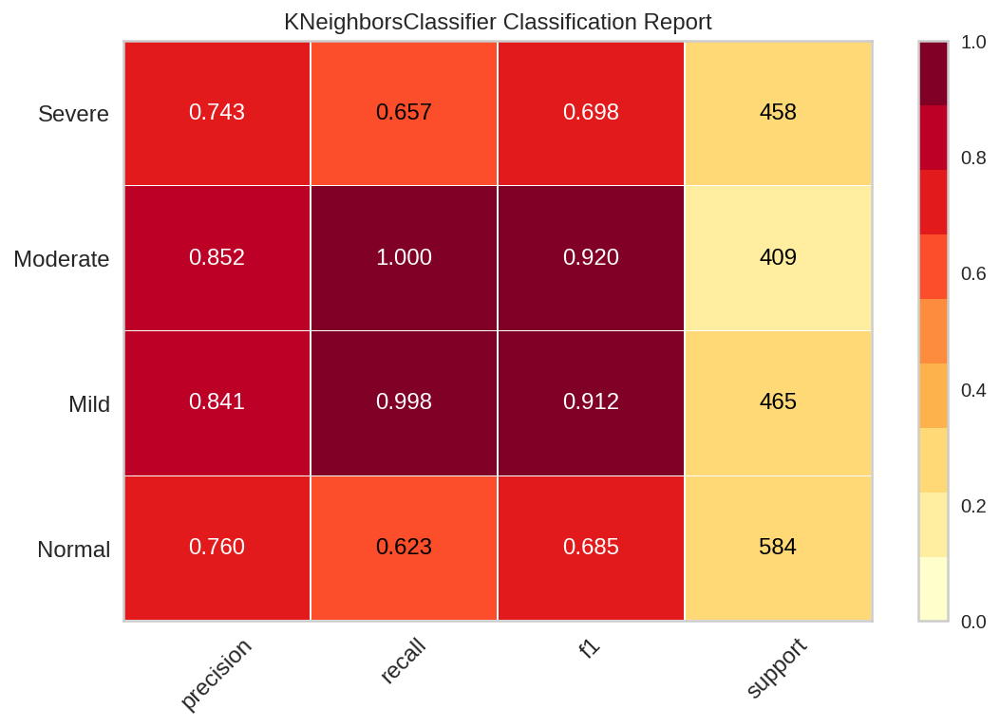

...

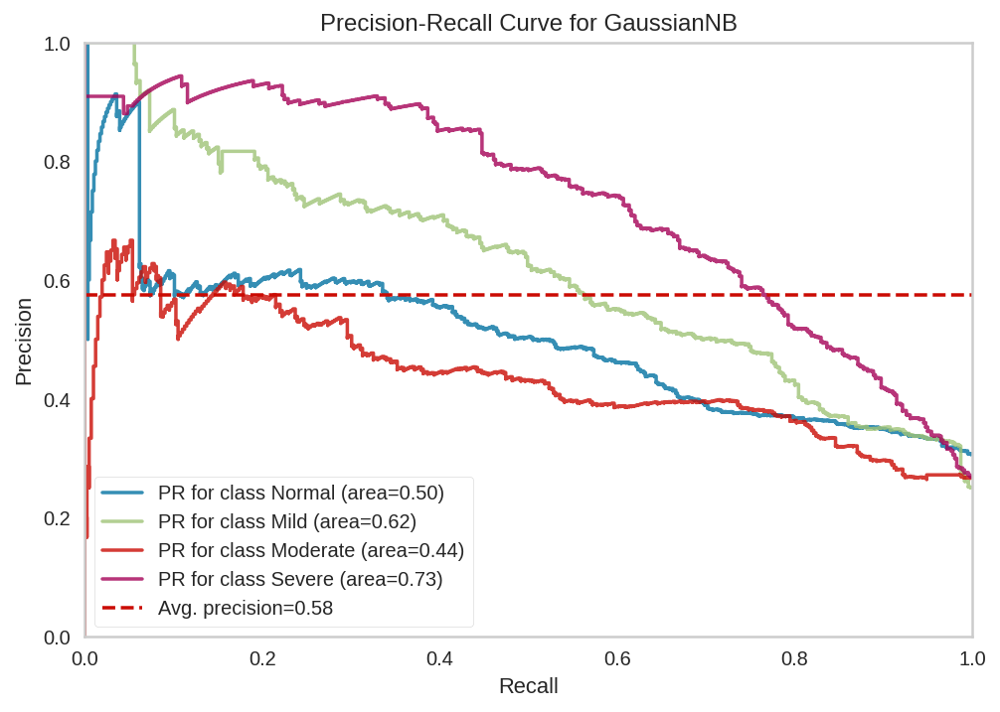

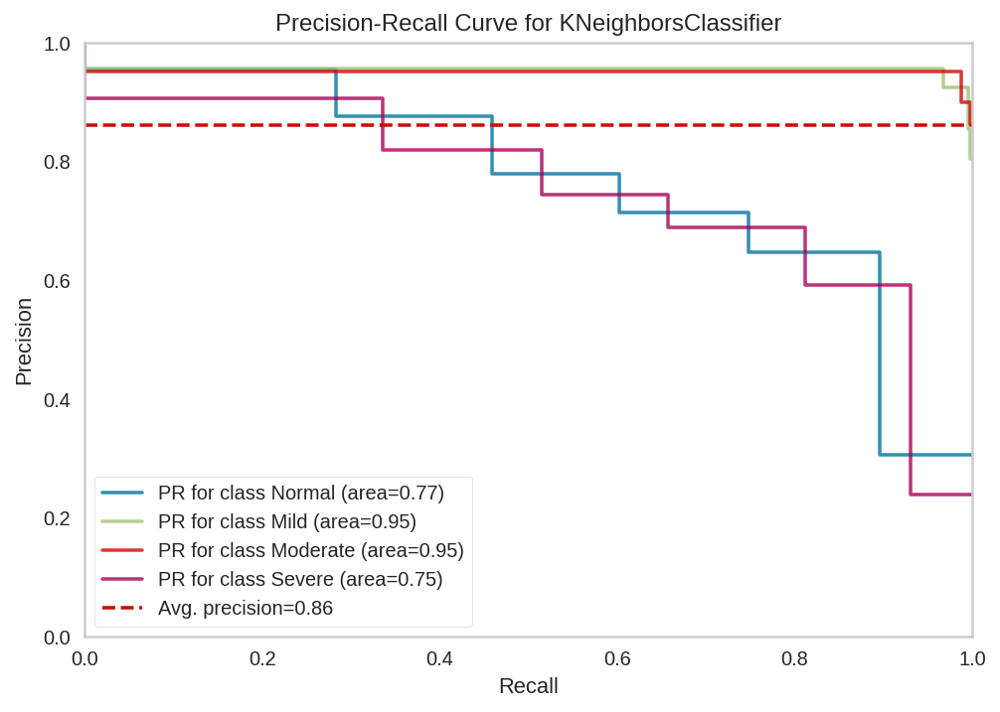

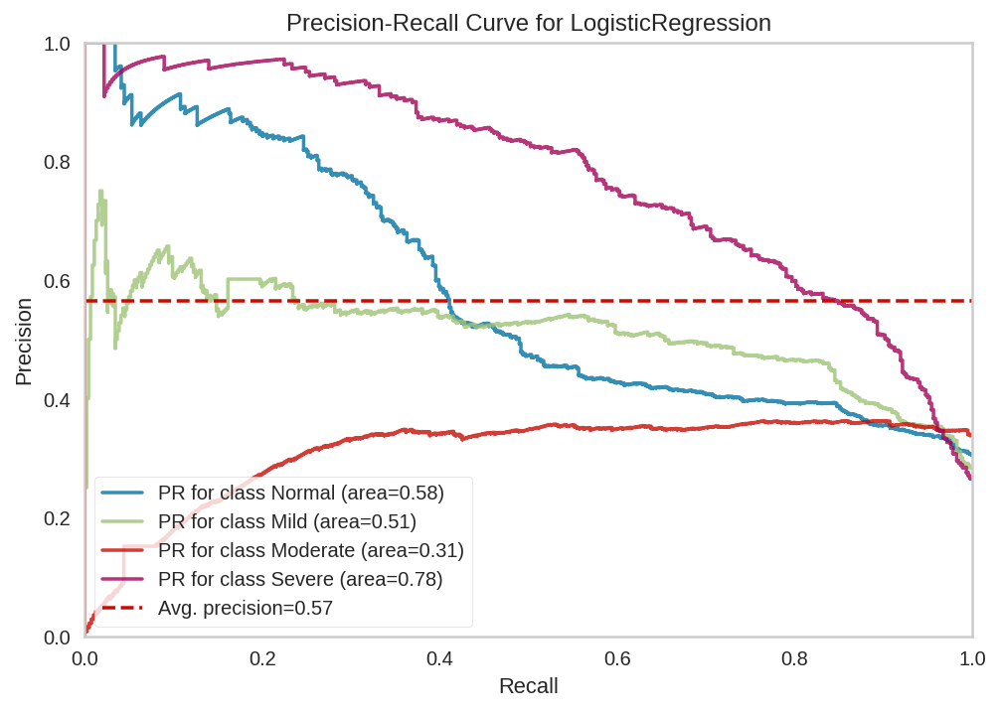

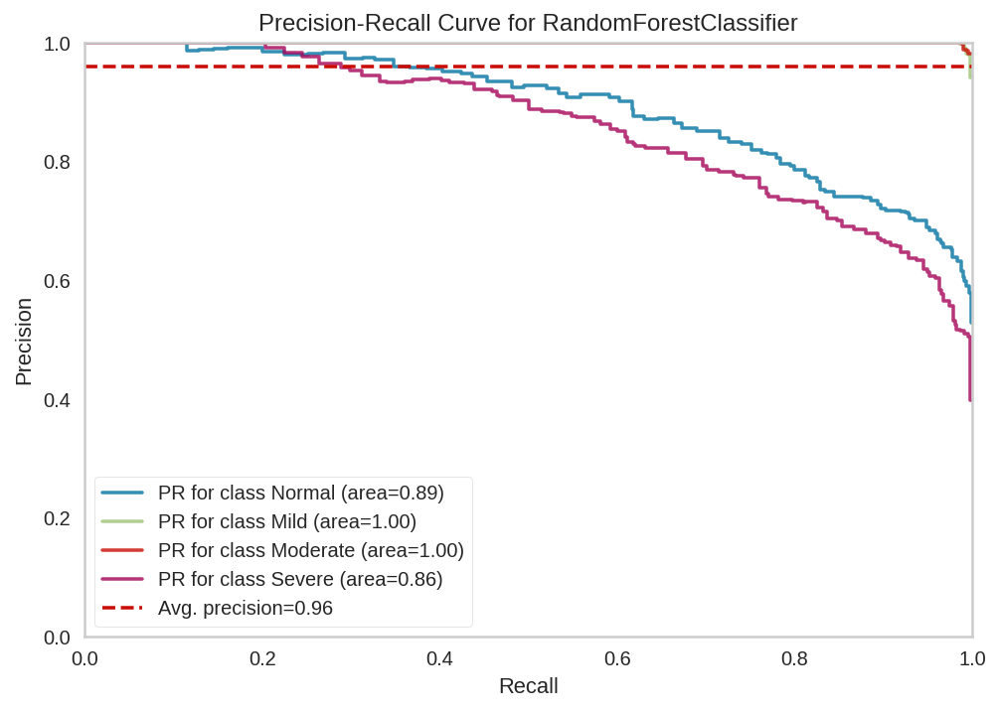

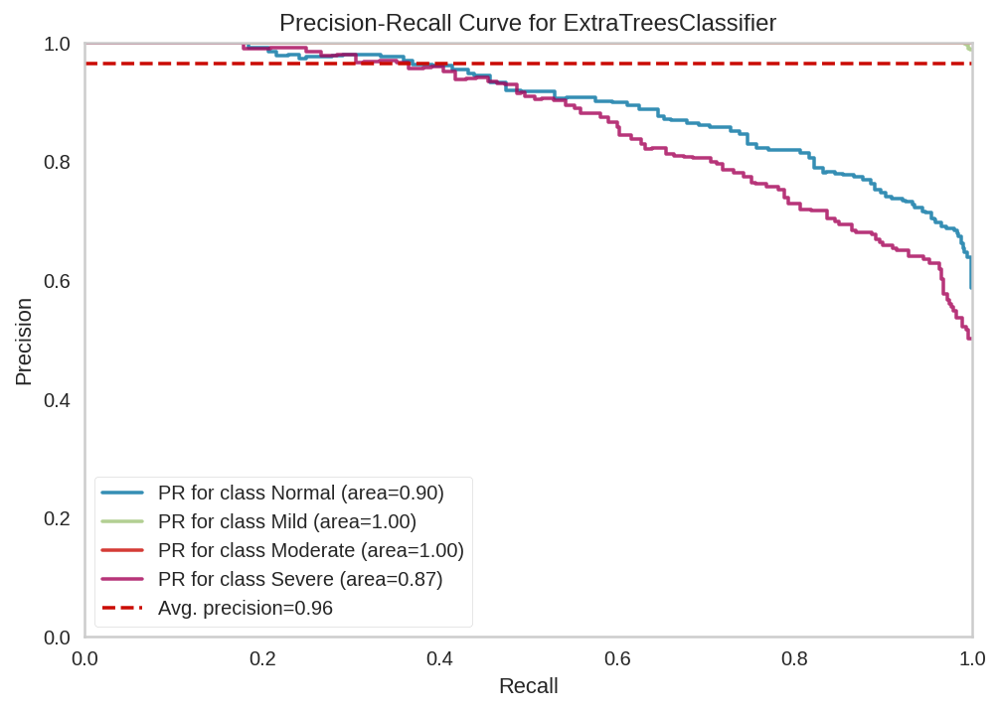

In [65]:
#Print visualization
visualization =[CR_viz(),CPE_viz(),CM_viz(),ROC_viz(),PRC_viz()]

In [66]:
#Print aggregate metrics  
classifier_metrics()

DecisionTreeClassifier(random_state=0)
cohen_kappa_score: 0.757
log_loss: 6.273
zero_one_loss: 0.182
hemming_loss: 0.182
matthews_corrcoef: 0.757

--------------------------------------------
SVC(random_state=0)
cohen_kappa_score: 0.396
log_loss: 0.000
zero_one_loss: 0.456
hemming_loss: 0.456
matthews_corrcoef: 0.401

--------------------------------------------
LinearSVC(random_state=0)
cohen_kappa_score: 0.022
log_loss: 0.000
zero_one_loss: 0.681
hemming_loss: 0.681
matthews_corrcoef: 0.094

--------------------------------------------
GaussianNB()
cohen_kappa_score: 0.408
log_loss: 1.564
zero_one_loss: 0.445
hemming_loss: 0.445
matthews_corrcoef: 0.419

--------------------------------------------
KNeighborsClassifier()
cohen_kappa_score: 0.737
log_loss: 1.933
zero_one_loss: 0.197
hemming_loss: 0.197
matthews_corrcoef: 0.740

--------------------------------------------
LogisticRegression(random_state=0)
cohen_kappa_score: 0.316
log_loss: 1.087
zero_one_loss: 0.507
hemming_loss: 0.5

In [67]:
df1

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.06593,88.0,174.0,57.5,39.0,96.0,106.0,20.0,1,0
1,0,8,26.98962,78.0,170.0,57.0,36.0,90.0,100.0,20.0,1,0
2,0,16,23.93948,75.0,177.0,59.0,39.0,88.0,104.0,20.0,1,0
3,0,15,22.12974,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
4,0,15,22.12974,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9573,0,13,24.59876,65.0,163.0,55.9,37.0,88.0,98.0,61.0,0,2
9574,0,14,26.06920,70.0,163.0,55.7,36.0,87.0,103.0,59.0,0,2
9575,0,14,24.83904,66.0,163.0,57.3,38.0,88.0,95.0,57.0,1,2
9576,0,3,24.29443,71.0,171.0,57.0,37.0,85.0,100.0,28.0,1,2


In [68]:
df1.describe()

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
count,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000
mean,0.152433,9.423053,25.921425,72.837022,167.303508,56.209720,36.844122,88.803404,99.853310,44.166736,0.651075,1.407601
std,0.359459,5.196683,4.378153,14.420926,8.163700,1.966513,3.660380,11.121496,8.195487,12.259220,0.476655,1.150143
min,0.000000,0.000000,14.765500,37.000000,140.000000,47.000000,26.000000,56.000000,70.000000,20.000000,0.000000,0.000000
25%,0.000000,6.000000,23.243997,65.000000,162.000000,55.000000,35.000000,82.000000,95.000000,34.000000,0.000000,0.000000
50%,0.000000,9.000000,25.308330,72.000000,168.000000,56.200000,37.000000,88.000000,99.000000,42.000000,1.000000,1.000000
75%,0.000000,13.000000,27.768747,79.000000,173.000000,57.500000,38.000000,94.000000,104.000000,55.000000,1.000000,2.000000
max,1.000000,48.000000,59.637310,161.000000,198.000000,66.000000,57.000000,156.000000,150.000000,80.000000,1.000000,3.000000


### **CASE-2**

In [69]:
df2=pd.read_csv('preprocessed_datset.csv') 
df2.head()


,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.065927,88.0,174.0,57.5,39.0,95.5,106.5,20.0,1,0
1,0,8,26.989619,78.0,170.0,57.0,36.5,90.0,100.0,20.0,1,0
2,0,16,23.939481,75.0,177.0,59.0,39.0,88.0,104.0,20.0,1,0
3,0,15,22.129740,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
4,0,15,22.129740,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0


In [70]:
p=df2.drop('status',axis=1)
q=df2['status']

In [71]:
oversample = SMOTE()
p, q = oversample.fit_resample(p, q)

Class=0, n=2884 (25.000%)
Class=3, n=2884 (25.000%)
Class=2, n=2884 (25.000%)
Class=1, n=2884 (25.000%)


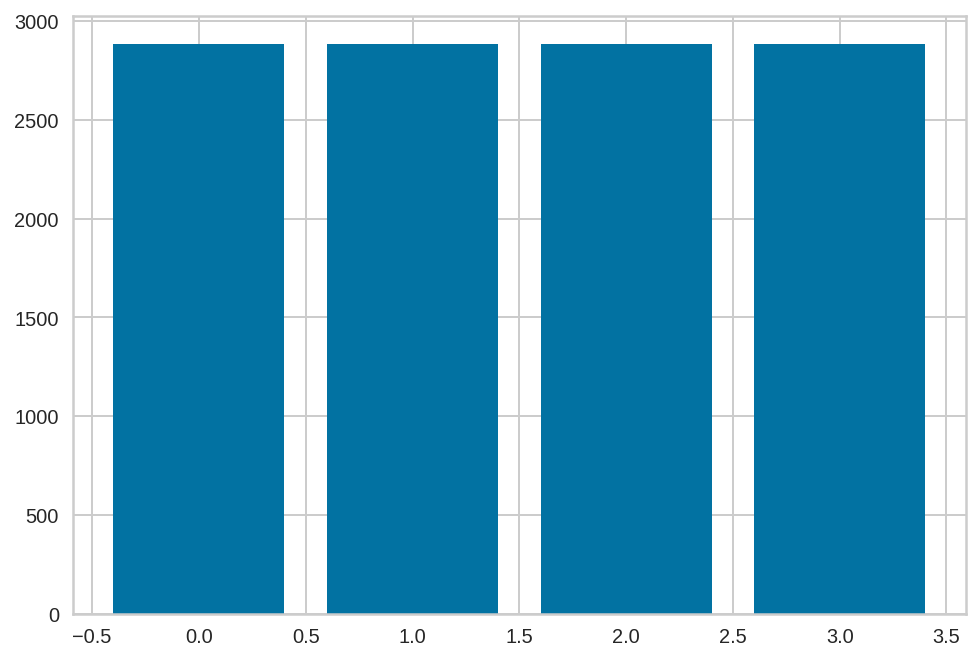

In [72]:
from collections import Counter
from matplotlib import pyplot
counter = Counter(q)
for k,v in counter.items():
	per = v / len(q) * 100
	print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
 
pyplot.bar(counter.keys(), counter.values())
pyplot.show()

Text(0, 0.5, 'Frequency')

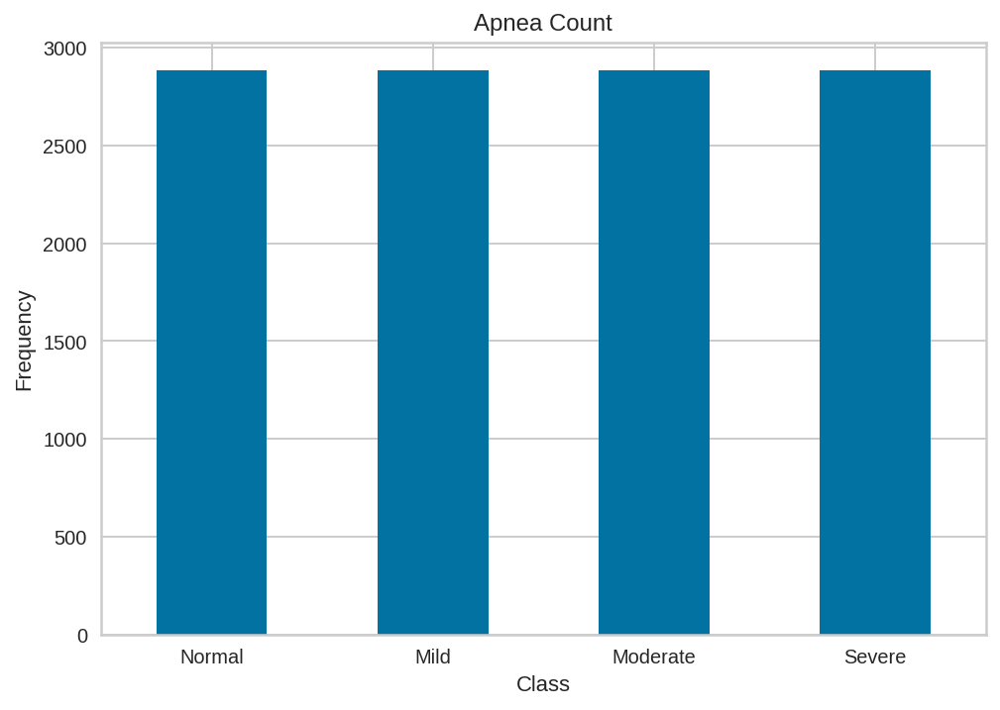

In [73]:
LABELS = ["Normal", "Mild","Moderate","Severe"]

count_classes = pd.value_counts(q, sort = True)

count_classes.plot(kind = 'bar', rot=0)

plt.title("Apnea Count")

plt.xticks(range(4), LABELS)

plt.xlabel("Class")

plt.ylabel("Frequency")

0    2884
3    2884
2    2884
1    2884
Name: status, dtype: int64


<function matplotlib.pyplot.show(*args, **kw)>

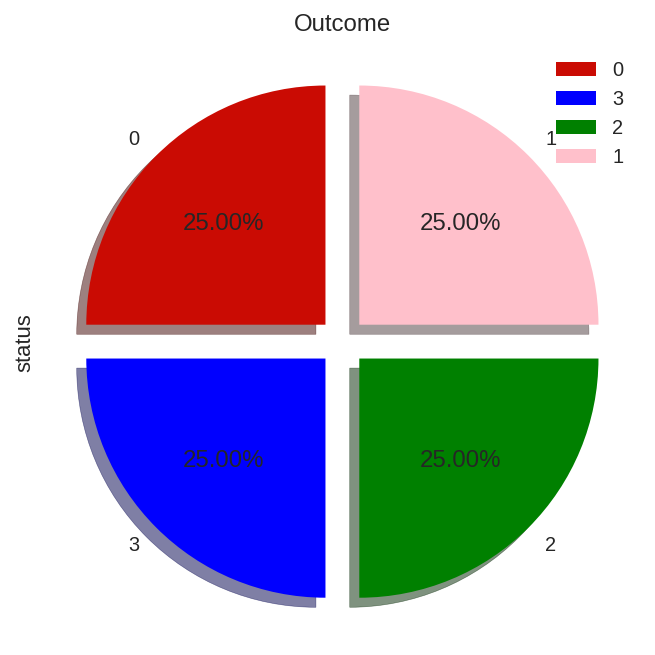

In [74]:
print(q.value_counts())
color=['r',"blue","green","pink"]
q.value_counts().plot.pie(colors=color,startangle=90, shadow=True,explode=(0.1, 0.1, 0.1, 0.1), autopct='%1.2f%%').set_title('Outcome')
plt.legend()
plt.show

In [75]:
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(p,q)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(p.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(12,'Score'))  #print top 10 best features

      Specs        Score
3    Weight  7066.102522
7     Waist  4877.283587
9       Age  3793.147843
2       BMI  1754.176043
1       ESS  1211.671002
8   Buttock  1096.845501
6      Neck  1095.212131
0        BQ   625.109764
10        M   476.835511
4    Height   299.413401
5      Head    66.850362


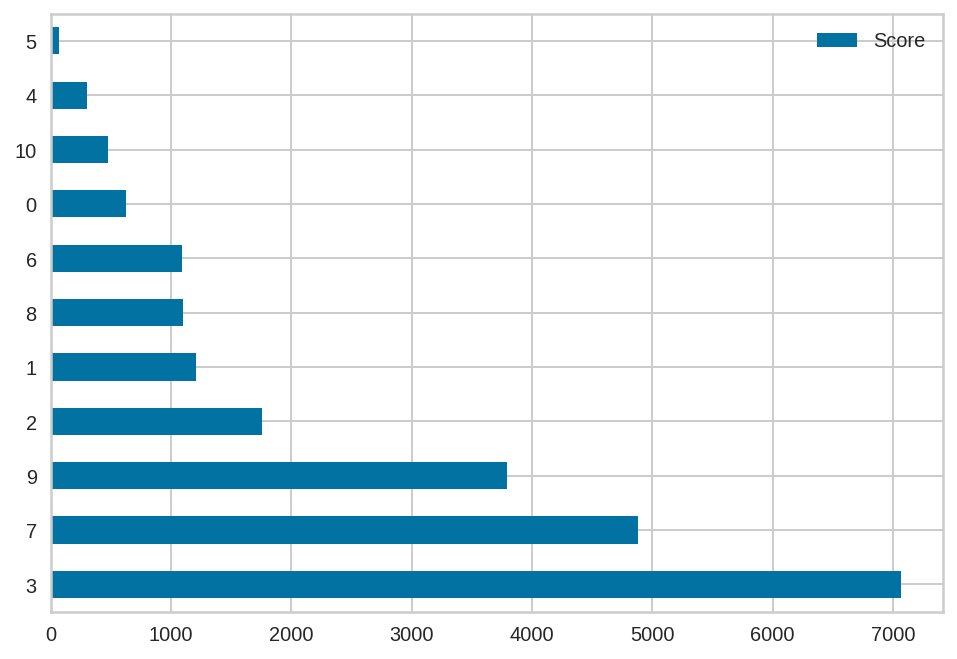

In [76]:
featureScores.nlargest(15,'Score').plot(kind='barh')
plt.show()

[0.02880619 0.09481647 0.09976954 0.09526404 0.09789907 0.09498835
 0.09417317 0.13285619 0.08016732 0.13531472 0.04594493]


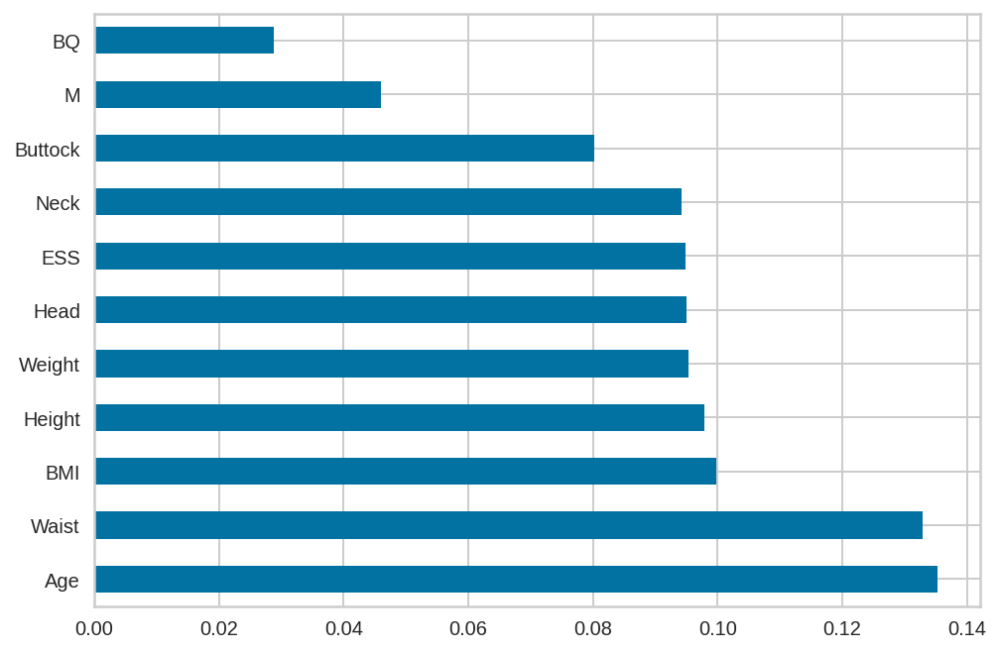

In [77]:
model = ExtraTreesClassifier()
model.fit(p,q)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for  visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(12).plot(kind='barh')
plt.show()

In [78]:
p

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M
0,0,14,29.065927,88.000000,174.000000,57.500000,39.000000,95.500000,106.500000,20.000000,1
1,0,8,26.989619,78.000000,170.000000,57.000000,36.500000,90.000000,100.000000,20.000000,1
2,0,16,23.939481,75.000000,177.000000,59.000000,39.000000,88.000000,104.000000,20.000000,1
3,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1
4,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1
...,...,...,...,...,...,...,...,...,...,...,...
11531,0,14,37.659352,116.853678,176.149222,56.798444,46.776167,122.589639,122.000000,31.925389,1
11532,0,17,22.034147,64.000000,170.430517,56.455586,35.430517,80.291551,91.000000,44.861034,1
11533,0,8,23.529412,68.000000,170.000000,55.169763,35.901858,86.488063,96.389921,50.610079,1
11534,0,8,25.966479,82.236190,177.962210,59.000000,39.716573,91.141714,101.236190,42.905524,1


In [79]:
q

0        0
1        0
2        0
3        0
4        0
        ..
11531    3
11532    3
11533    3
11534    3
11535    3
Name: status, Length: 11536, dtype: int64

In [80]:
df2 = pd.concat([p,q],axis='columns')
df2

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.065927,88.000000,174.000000,57.500000,39.000000,95.500000,106.500000,20.000000,1,0
1,0,8,26.989619,78.000000,170.000000,57.000000,36.500000,90.000000,100.000000,20.000000,1,0
2,0,16,23.939481,75.000000,177.000000,59.000000,39.000000,88.000000,104.000000,20.000000,1,0
3,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1,0
4,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
11531,0,14,37.659352,116.853678,176.149222,56.798444,46.776167,122.589639,122.000000,31.925389,1,3
11532,0,17,22.034147,64.000000,170.430517,56.455586,35.430517,80.291551,91.000000,44.861034,1,3
11533,0,8,23.529412,68.000000,170.000000,55.169763,35.901858,86.488063,96.389921,50.610079,1,3
11534,0,8,25.966479,82.236190,177.962210,59.000000,39.716573,91.141714,101.236190,42.905524,1,3


In [81]:
df2=df2.round({'BQ' : 0,'ESS' : 0,'BMI' : 5,'Weight' : 0,'Height' : 0,'Head' : 1,'Neck' : 0,'Waist' : 0,'Buttock' : 0,'Age' : 0,'M' : 0,'status' : 0,})

In [82]:
df2

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.06593,88.0,174.0,57.5,39.0,96.0,106.0,20.0,1,0
1,0,8,26.98962,78.0,170.0,57.0,36.0,90.0,100.0,20.0,1,0
2,0,16,23.93948,75.0,177.0,59.0,39.0,88.0,104.0,20.0,1,0
3,0,15,22.12974,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
4,0,15,22.12974,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
11531,0,14,37.65935,117.0,176.0,56.8,47.0,123.0,122.0,32.0,1,3
11532,0,17,22.03415,64.0,170.0,56.5,35.0,80.0,91.0,45.0,1,3
11533,0,8,23.52941,68.0,170.0,55.2,36.0,86.0,96.0,51.0,1,3
11534,0,8,25.96648,82.0,178.0,59.0,40.0,91.0,101.0,43.0,1,3


In [83]:
df2.describe()

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
count,11536.000000,11536.000000,11536.000000,11536.000000,11536.000000,11536.000000,11536.000000,11536.000000,11536.000000,11536.000000,11536.000000,11536.000000
mean,0.135836,9.503294,26.034776,73.243412,167.429005,56.206380,36.928918,89.083478,100.089112,44.062933,0.650312,1.500000
std,0.342629,5.159022,4.347597,14.244063,8.071408,1.937815,3.620389,10.961677,8.081072,12.161392,0.476892,1.118082
min,0.000000,0.000000,14.765500,37.000000,140.000000,47.000000,26.000000,56.000000,70.000000,20.000000,0.000000,0.000000
25%,0.000000,6.000000,23.374018,66.000000,163.000000,55.000000,35.000000,83.000000,95.000000,34.000000,0.000000,0.750000
50%,0.000000,9.000000,25.397970,73.000000,168.000000,56.200000,37.000000,88.000000,100.000000,42.000000,1.000000,1.500000
75%,0.000000,13.000000,27.904022,80.000000,173.000000,57.500000,39.000000,94.000000,104.000000,55.000000,1.000000,2.250000
max,1.000000,48.000000,59.637310,161.000000,198.000000,66.000000,57.000000,156.000000,150.000000,80.000000,1.000000,3.000000


In [84]:
df2.to_csv('sampled1_dataset.csv')

In [85]:
p=df2.drop('status',axis=1)
q=df2['status']

In [86]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(p, q, test_size=.2)
print('X_train', X_train.shape)
print('y_train', y_train.shape)
print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (9228, 11)
y_train (9228,)
X_test (2308, 11)
y_test (2308,)


In [87]:
def evaluate(model, X_test , y_test,modelname):
  y_pred1=model.predict(X_test)

  accuracy     = accuracy_score(y_test, y_pred1)
  classification=classification_report(y_test, y_pred1)
  confusion    = confusion_matrix(y_test, y_pred1)
  df_model2 = pd.DataFrame({  'model'        : [modelname],
                             'accuracy'     : [accuracy],
                           'classification':[classification],
                             'timetaken'    : [time2],
                            'confusionmatrix' : [confusion]
                            
                                }) 
  return df_model2

In [88]:
%%time
time2=time.time()
print("base model")
base_model = RandomForestClassifier(random_state=0)
base_model.fit(X_train, y_train)

model11 = evaluate(base_model,  X_test,  y_test, 'RandomForest')
model11.timetaken[0] = time.time() - time2
print("Random Forest")
print(base_model.get_params())
print(model1)



base model
Random Forest
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}
          model  accuracy                                     classification  \
0  RandomForest  0.884134                precision    recall  f1-score   ...   

   timetaken                                    confusionmatrix  
0   1.551015  [[491, 4, 7, 82], [1, 464, 0, 0], [0, 0, 409, ...  
CPU times: user 1.39 s, sys: 3.93 ms, total: 1.39 s
Wall time: 1.39 s


In [89]:
%%time
from sklearn.ensemble import ExtraTreesClassifier

time2=time.time()
print("base model")
base_model12 = ExtraTreesClassifier(random_state=0)
base_model12.fit(X_train, y_train)
model12 = evaluate(base_model12,  X_test,  y_test, 'Extra Tree')
model12.timetaken[0] = time.time() - time2
print("Extra Tree")
print(base_model12.get_params())

base model
Extra Tree
{'bootstrap': False, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}
CPU times: user 1.28 s, sys: 22.5 ms, total: 1.31 s
Wall time: 1.36 s


In [90]:
%%time
time2=time.time()
print("base model")
base_model13 = LogisticRegression(random_state=0)
base_model13.fit(X_train, y_train)
model13 = evaluate(base_model13,  X_test,  y_test, 'Logistic Regression')
model13.timetaken[0] = time.time() - time2
print("Logoistic Regression")
print(base_model13.get_params())

base model
Logoistic Regression
{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 0, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
CPU times: user 714 ms, sys: 528 ms, total: 1.24 s
Wall time: 656 ms


In [91]:
%%time
time2=time.time()
print("base model")
base_model14 = KNeighborsClassifier()
base_model14.fit(X_train, y_train)
model14 = evaluate(base_model14,  X_test,  y_test, 'KNN')
model14.timetaken[0] = time.time() - time2
print("KNN")
print(base_model14.get_params())

base model
KNN
{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}
CPU times: user 138 ms, sys: 2.76 ms, total: 141 ms
Wall time: 144 ms


In [92]:
%%time
time2=time.time()
print("base model")
base_model15 = LinearSVC(random_state=0)
base_model15.fit(X_train, y_train)
model15 = evaluate(base_model15,  X_test,  y_test, 'LinearSVC')
model15.timetaken[0] = time.time() - time2
print("LinearSVC")
print(base_model15.get_params())

base model
LinearSVC
{'C': 1.0, 'class_weight': None, 'dual': True, 'fit_intercept': True, 'intercept_scaling': 1, 'loss': 'squared_hinge', 'max_iter': 1000, 'multi_class': 'ovr', 'penalty': 'l2', 'random_state': 0, 'tol': 0.0001, 'verbose': 0}
CPU times: user 3.69 s, sys: 7.72 ms, total: 3.7 s
Wall time: 3.75 s


In [93]:
%%time
time2=time.time()
print("base model")
base_model16 = GaussianNB()
base_model16.fit(X_train, y_train)
model16 = evaluate(base_model16,  X_test,  y_test, 'GaussianNB')
model16.timetaken[0] = time.time() - time2
print("GaussianNB")
print(base_model16.get_params())

base model
GaussianNB
{'priors': None, 'var_smoothing': 1e-09}
CPU times: user 24.2 ms, sys: 1.01 ms, total: 25.2 ms
Wall time: 25.2 ms


In [94]:
%%time
time2=time.time()
print("base model")
base_model17=SVC(random_state=0)
base_model17.fit(X_train, y_train)
model17 = evaluate(base_model17,  X_test,  y_test, 'SVC')
model17.timetaken[0] = time.time() - time2
print("SVC")
print(base_model17.get_params())

base model
SVC
{'C': 1.0, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'probability': False, 'random_state': 0, 'shrinking': True, 'tol': 0.001, 'verbose': False}
CPU times: user 5.87 s, sys: 30.2 ms, total: 5.9 s
Wall time: 5.9 s


In [95]:
%%time
time2=time.time()
print("base model")
base_model18=DecisionTreeClassifier(random_state=0)
base_model18.fit(X_train, y_train)
model18 = evaluate(base_model18,  X_test,  y_test, 'Decision Tree')
model18.timetaken[0] = time.time() - time2
print("Decision Tree")
print(base_model18.get_params())


base model
Decision Tree
{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 0, 'splitter': 'best'}
CPU times: user 73 ms, sys: 0 ns, total: 73 ms
Wall time: 72.6 ms


In [96]:
df_base2= pd.concat([model11,model12,model13,model14,model15,model16,model17,model18],axis = 0).reset_index()
df_base2.drop('index', axis=1, inplace=True)
df_base2

,model,accuracy,classification,timetaken,confusionmatrix
0,RandomForest,0.900780,precision recall f1-score ...,1.387646,"[[445, 5, 3, 121], [0, 565, 0, 0], [0, 0, 606,..."
1,Extra Tree,0.896880,precision recall f1-score ...,1.357758,"[[449, 5, 4, 116], [1, 564, 0, 0], [0, 0, 605,..."
2,Logistic Regression,0.522097,precision recall f1-score ...,0.653064,"[[156, 165, 129, 124], [121, 268, 122, 54], [9..."
3,KNN,0.840555,precision recall f1-score ...,0.142630,"[[331, 62, 46, 135], [0, 565, 0, 0], [0, 0, 60..."
4,LinearSVC,0.432409,precision recall f1-score ...,3.744132,"[[47, 380, 3, 144], [10, 554, 0, 1], [33, 483,..."
5,GaussianNB,0.583622,precision recall f1-score ...,0.023520,"[[203, 195, 83, 93], [61, 432, 63, 9], [61, 14..."
6,SVC,0.576690,precision recall f1-score ...,5.902611,"[[149, 190, 127, 108], [28, 379, 119, 39], [20..."
7,Decision Tree,0.872184,precision recall f1-score ...,0.071561,"[[418, 19, 8, 129], [5, 558, 0, 2], [3, 0, 602..."


In [97]:
classifiers=[
DecisionTreeClassifier(random_state=0),
SVC(random_state=0),
GaussianNB(),
KNeighborsClassifier(),
LogisticRegression(random_state=0),
RandomForestClassifier(random_state=0),
ExtraTreesClassifier(random_state=0)]

In [98]:
classes =  ["Normal", "Mild","Moderate","Severe"]
classes

['Normal', 'Mild', 'Moderate', 'Severe']

In [99]:
#for class-centric metrics
# Classification report :
def CR_viz():
    def Class_report(model,classes):
        visualizer = ClassificationReport(model, classes=classes, support=True)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        visualizer.score(X_test, y_test)  # Evaluate the model on the test data
        return visualizer.poof()
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        Class_report(name,classes)

#Class Prediction Error
def CPE_viz():    
    def CPE(model,classes):
        visualizer = ClassPredictionError(model, classes=classes)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        visualizer.score(X_test, y_test)  # Evaluate the model on the test data 
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        CPE(name,classes)
        
#Confusion matrix
def CM_viz():    
    def CM(model,classes):
        visualizer = ConfusionMatrix(model, classes=classes,percent=True)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        visualizer.score(X_test, y_test)  # Evaluate the model on the test data 
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        CM(name,classes)
        
#ROC-AUC
def ROC_viz():    
    def ROC(model,classes):
        visualizer = ROCAUC(model, classes=classes)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        visualizer.score(X_test, y_test)  # Evaluate the model on the test data 
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        ROC(name,classes)

#Precision Recall Curve
def PRC_viz():  
    def PRC(model,classes):
        visualizer = PrecisionRecallCurve(model,classes=classes, per_class=True, iso_f1_curves=False,
    fill_area=False, micro=False)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        visualizer.score(X_test, y_test)  # Evaluate the model on the test data 
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        PRC(name,classes)


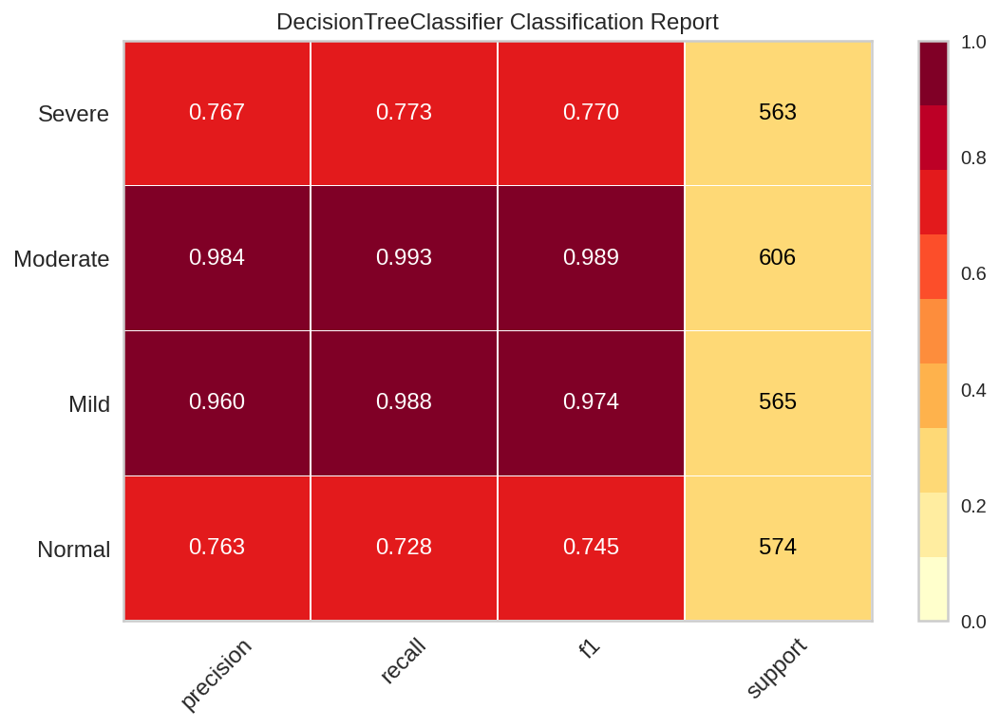

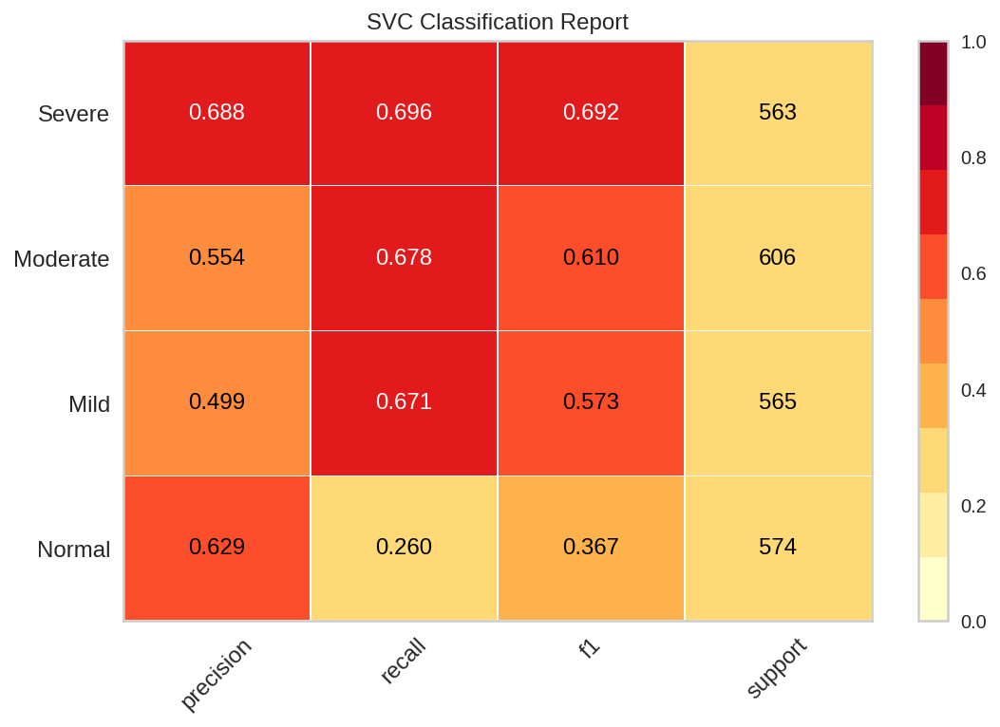

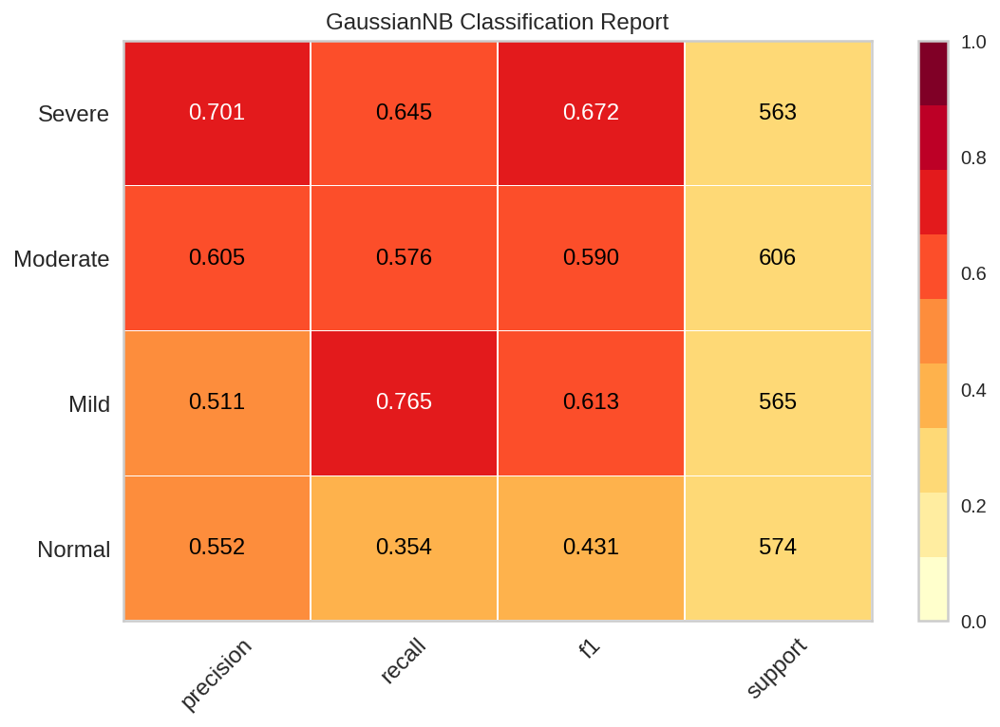

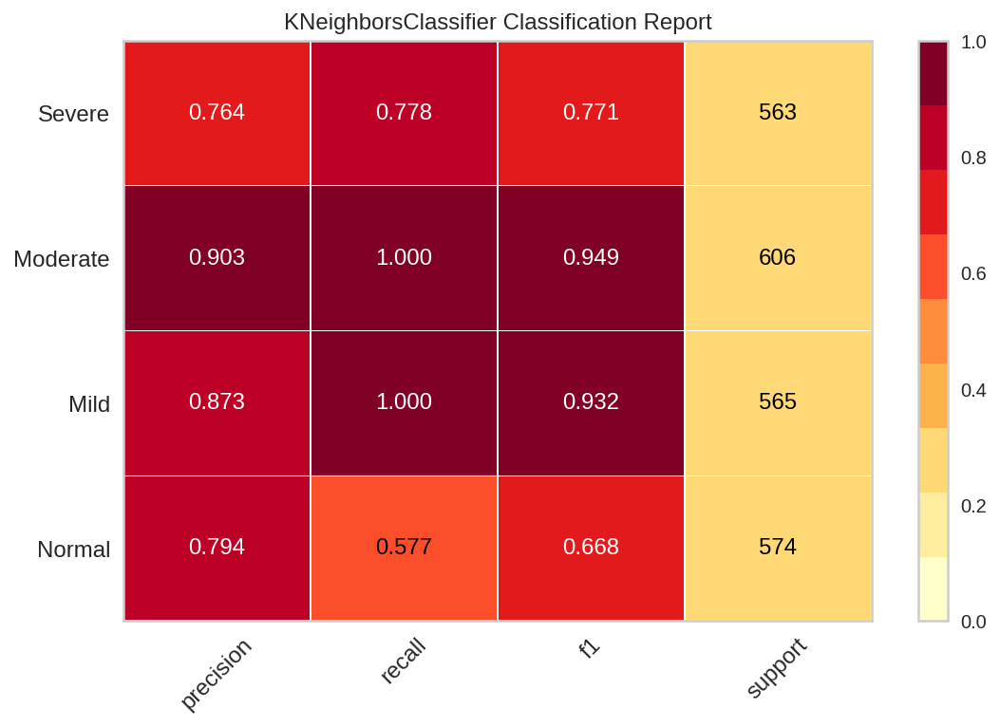

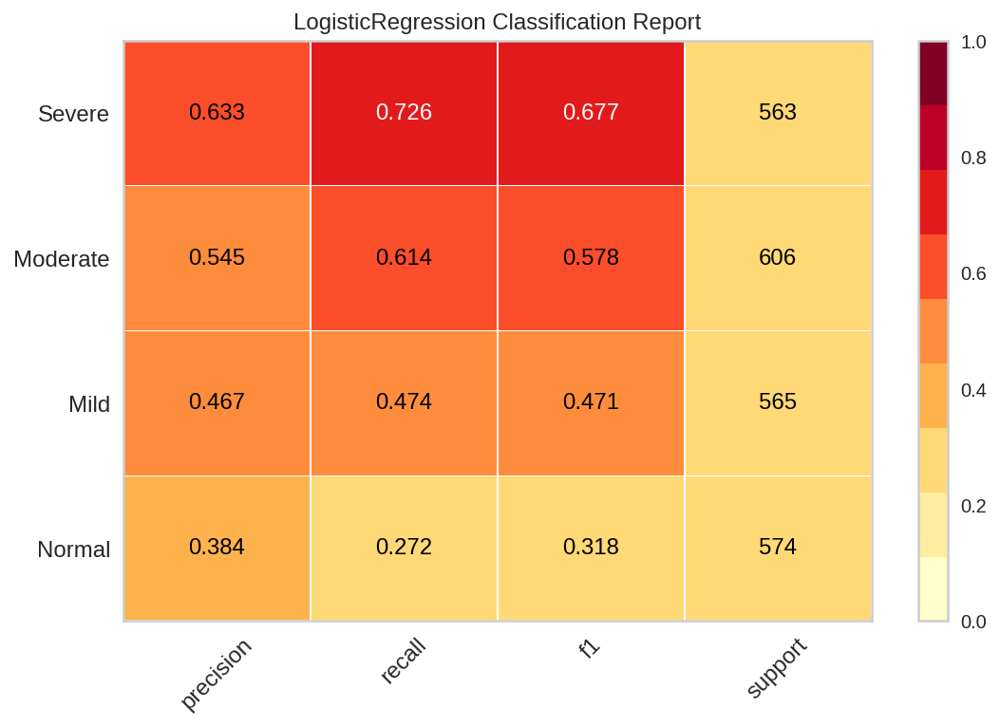

...

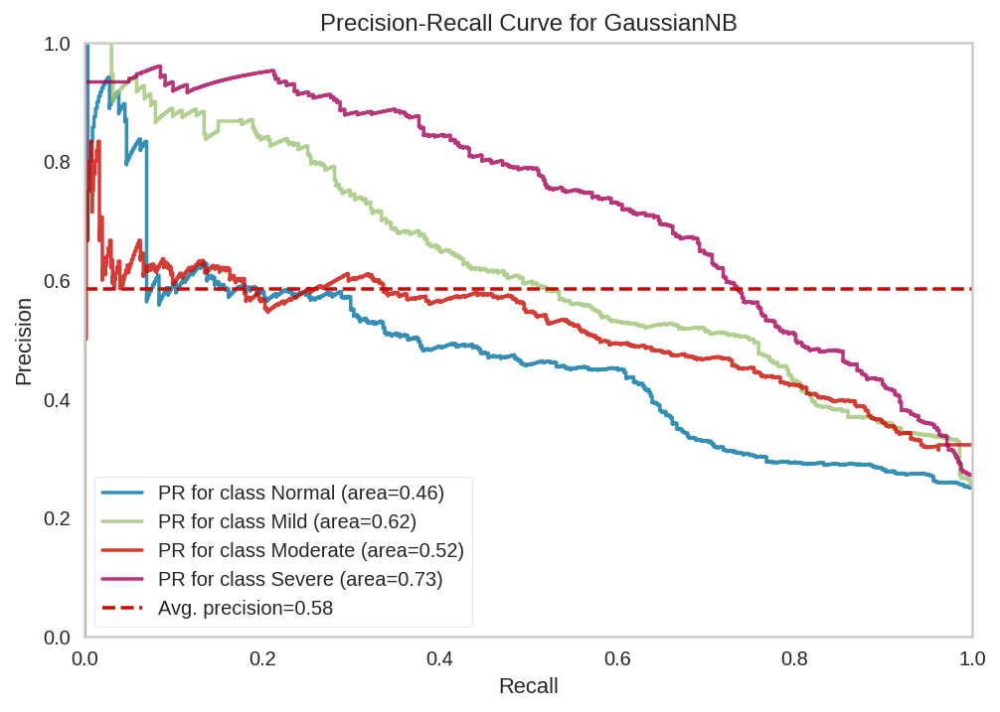

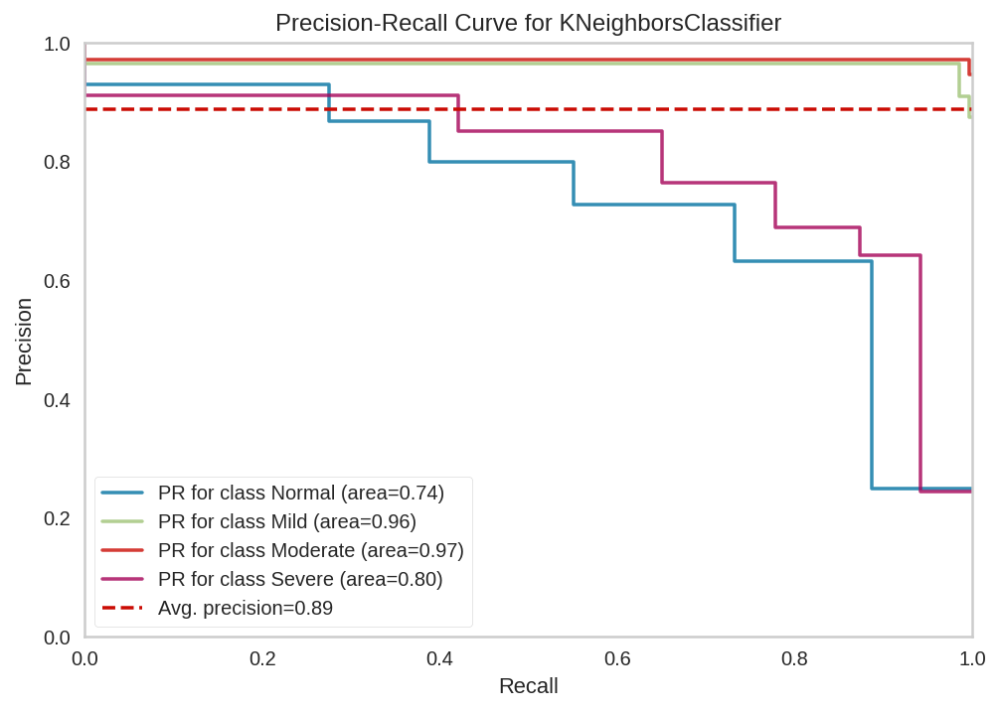

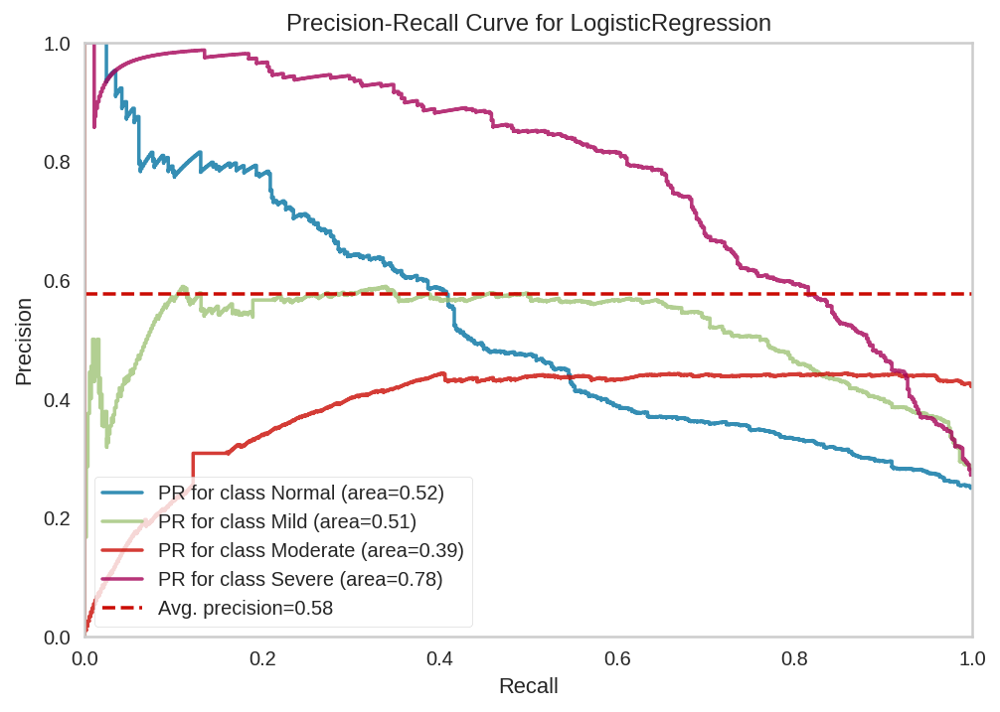

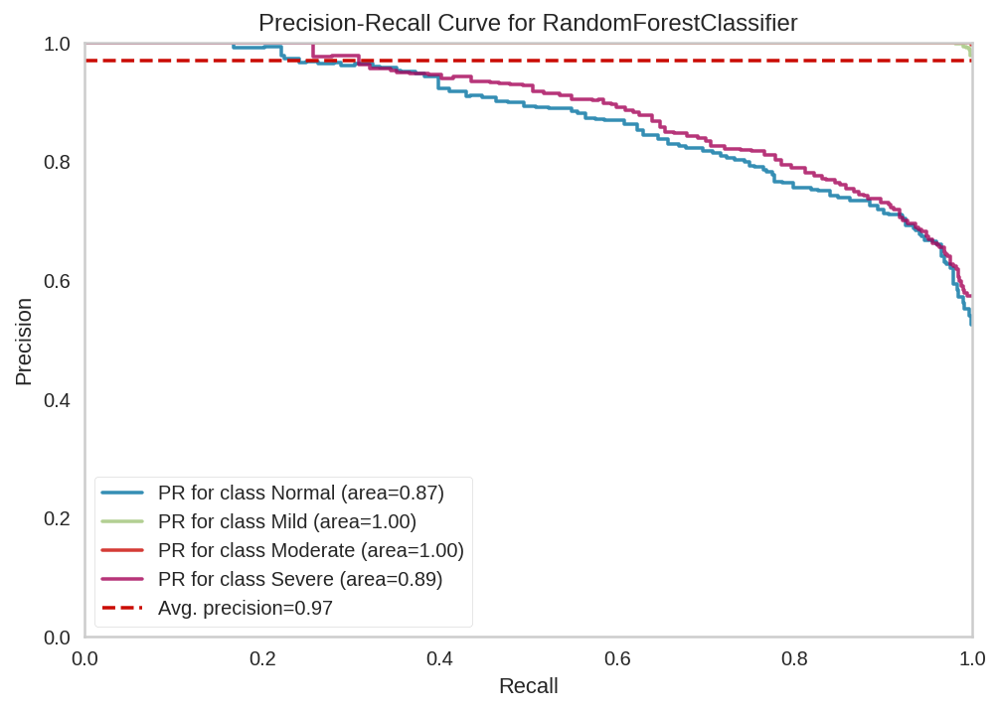

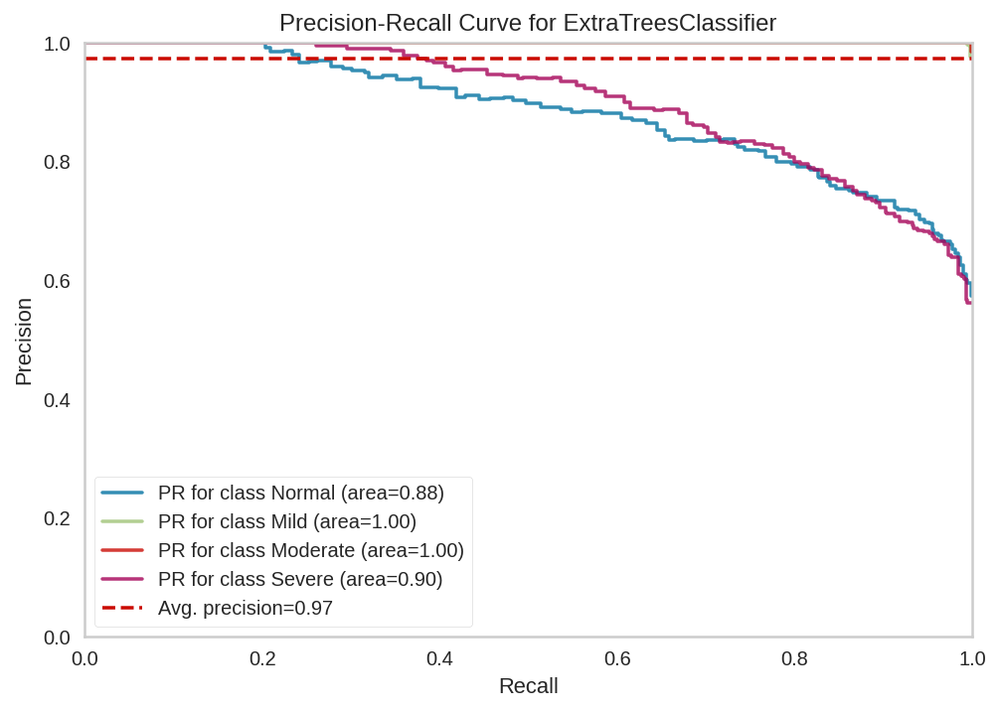

In [100]:
#Plot visualization
visualization =[CR_viz(),CPE_viz(),CM_viz(),ROC_viz(),PRC_viz()]

In [101]:
#Plot aggregate metrics  
classifier_metrics()

DecisionTreeClassifier(random_state=0)
cohen_kappa_score: 0.830
log_loss: 4.415
zero_one_loss: 0.128
hemming_loss: 0.128
matthews_corrcoef: 0.830

--------------------------------------------
SVC(random_state=0)
cohen_kappa_score: 0.435
log_loss: 0.000
zero_one_loss: 0.423
hemming_loss: 0.423
matthews_corrcoef: 0.445

--------------------------------------------
GaussianNB()
cohen_kappa_score: 0.445
log_loss: 1.566
zero_one_loss: 0.416
hemming_loss: 0.416
matthews_corrcoef: 0.452

--------------------------------------------
KNeighborsClassifier()
cohen_kappa_score: 0.787
log_loss: 1.674
zero_one_loss: 0.159
hemming_loss: 0.159
matthews_corrcoef: 0.791

--------------------------------------------
LogisticRegression(random_state=0)
cohen_kappa_score: 0.362
log_loss: 1.085
zero_one_loss: 0.478
hemming_loss: 0.478
matthews_corrcoef: 0.364

--------------------------------------------
RandomForestClassifier(random_state=0)
cohen_kappa_score: 0.868
log_loss: 0.246
zero_one_loss: 0.099
hemm

In [102]:
df_base2['confusionmatrix']
df_base2.to_csv('Balanced_data2_performance_metrics.csv')

In [103]:
print(df.shape)
print(df1.shape)
print(df2.shape)

(5208, 12)
(9578, 12)
(11536, 12)


## NEURAL NETWORK

In [104]:
df=pd.read_csv('preprocessed_datset.csv')  
df

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.065927,88.0,174.0,57.500000,39.0,95.5,106.5,20.0,1,0
1,0,8,26.989619,78.0,170.0,57.000000,36.5,90.0,100.0,20.0,1,0
2,0,16,23.939481,75.0,177.0,59.000000,39.0,88.0,104.0,20.0,1,0
3,0,15,22.129740,67.0,174.0,57.000000,35.0,74.0,94.0,20.0,1,0
4,0,15,22.129740,67.0,174.0,57.000000,35.0,74.0,94.0,20.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
5203,1,6,24.005487,63.0,162.0,57.000000,33.0,99.0,101.5,77.0,0,3
5204,0,13,29.964328,63.0,145.0,53.000000,35.8,102.0,112.0,77.0,0,3
5205,0,13,29.964328,63.0,145.0,53.000000,35.8,102.0,112.0,77.0,0,3
5206,0,0,24.654832,60.0,156.0,54.500000,35.0,83.5,99.0,79.0,0,3


In [105]:
x = df.drop("status", axis = 1)
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x = pd.DataFrame(sc.fit_transform(x))
y = df["status"]
print(x)

            0         1         2         3         4         5         6   \
0    -0.544805  0.727665  0.471981  0.732869  0.730835  0.493004  0.317320   
1    -0.544805 -0.307861  0.076874  0.150404  0.240260  0.252957 -0.284501   
2    -0.544805  1.072840 -0.503545 -0.024335  1.098766  1.213143  0.317320   
3    -0.544805  0.900252 -0.847926 -0.490308  0.730835  0.252957 -0.645594   
4    -0.544805  0.900252 -0.847926 -0.490308  0.730835  0.252957 -0.645594   
...        ...       ...       ...       ...       ...       ...       ...   
5203  1.835518 -0.653036 -0.490985 -0.723294 -0.740890  0.252957 -1.127051   
5204 -0.544805  0.555077  0.642940 -0.723294 -2.825833 -1.667416 -0.453011   
5205 -0.544805  0.555077  0.642940 -0.723294 -2.825833 -1.667416 -0.453011   
5206 -0.544805 -1.688561 -0.367419 -0.898033 -1.476752 -0.947276 -0.645594   
5207  1.835518  1.245427 -1.238405 -1.655238 -1.844684 -0.803249 -1.728872   

            7         8         9         10  
0     0.322288  

In [106]:
from keras.utils.np_utils import to_categorical
y_cate = to_categorical(y)
y_cate

array([[1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       ...,
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [1., 0., 0., 0.]], dtype=float32)

In [107]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x.values, y_cate, test_size=0.2)

In [108]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(4166, 11)
(4166, 4)
(1042, 11)
(1042, 4)


In [109]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
from keras.models import Sequential
from keras.layers import Activation, Dense
from keras.layers import Dropout
from tensorflow.keras.optimizers import SGD, Adam, Adadelta,Adagrad

## Adaptive Moment Estimation

In [112]:
model = Sequential()
model.add(Dense(64, input_shape = (11,), activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(32, activation = "relu"))

model.add(Dense(16, activation = "relu"))
model.add(Dense(8, activation = "relu"))
model.add(Dense(4, activation = "softmax"))

model.compile(Adam(lr = 0.01), "categorical_crossentropy", metrics = ["accuracy"])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 16)                528       
                                                                 
 dense_3 (Dense)             (None, 8)                 136       
                                                                 
 dense_4 (Dense)             (None, 4)                 36        
                                                                 
Total params: 3,548
Trainable params: 3,548
Non-trainable params: 0
_________________________________________________________________


In [113]:
%%time
model.fit(x_train, y_train,epochs=25)

Epoch 1/25
131/131 [==============================] - 1s 2ms/step - loss: 0.9990 - accuracy: 0.6138
Epoch 2/25
131/131 [==============================] - 0s 2ms/step - loss: 0.5061 - accuracy: 0.7712
Epoch 3/25
131/131 [==============================] - 0s 2ms/step - loss: 0.4897 - accuracy: 0.7784
Epoch 4/25
131/131 [==============================] - 0s 2ms/step - loss: 0.4838 - accuracy: 0.7787
Epoch 5/25
131/131 [==============================] - 0s 2ms/step - loss: 0.4737 - accuracy: 0.7823
Epoch 6/25
131/131 [==============================] - 0s 2ms/step - loss: 0.4739 - accuracy: 0.7796
Epoch 7/25
131/131 [==============================] - 0s 2ms/step - loss: 0.4669 - accuracy: 0.7823
Epoch 8/25
131/131 [==============================] - 0s 2ms/step - loss: 0.4642 - accuracy: 0.7876
Epoch 9/25
131/131 [==============================] - 0s 2ms/step - loss: 0.4616 - accuracy: 0.7895
Epoch 10/25
131/131 [==============================] - 0s 2ms/step - loss: 0.4573 - accuracy: 0.7933

In [114]:
model.evaluate(x_test,y_test)

33/33 [==============================] - 0s 2ms/step - loss: 0.4809 - accuracy: 0.7678


[0.4808706045150757, 0.767754316329956]

In [115]:
predictions = model.predict(x_test, steps=len(x_test), verbose=0)

In [116]:
y_pred = np.argmax(predictions, axis=-1)
y_pred[:10]

array([3, 0, 0, 0, 0, 0, 0, 3, 3, 3])

In [117]:
y_true=np.argmax(y_test, axis=-1)
y_true[:10]

array([3, 0, 0, 0, 0, 0, 0, 0, 3, 0])

In [118]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[465,   0,   0, 126],
       [  1,   0,   0,   1],
       [  2,   0,   0,   0],
       [112,   0,   0, 335]])

In [119]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print('\nAccuracy: {:.2f}\n'.format(accuracy_score(y_true, y_pred)))


Accuracy: 0.77



In [120]:
from sklearn.metrics import classification_report
print('\nClassification Report\n')
p=(classification_report(y_true, y_pred, target_names=["Normal", "Mild","Moderate","Severe"]))
print(p)
model1=p



Classification Report

              precision    recall  f1-score   support

      Normal       0.80      0.79      0.79       591
        Mild       0.00      0.00      0.00         2
    Moderate       0.00      0.00      0.00         2
      Severe       0.73      0.75      0.74       447

    accuracy                           0.77      1042
   macro avg       0.38      0.38      0.38      1042
weighted avg       0.77      0.77      0.77      1042



## Stochastic Gradient Descent

In [121]:
model = Sequential()
model.add(Dense(64, input_shape = (11,), activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(32, activation = "relu"))

model.add(Dense(16, activation = "relu"))

model.add(Dense(8, activation = "relu"))

model.add(Dense(4, activation = "softmax"))

model.compile(SGD(lr = 0.01), "categorical_crossentropy", metrics = ["accuracy"])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 64)                768       
                                                                 
 dense_6 (Dense)             (None, 32)                2080      
                                                                 
 dense_7 (Dense)             (None, 16)                528       
                                                                 
 dense_8 (Dense)             (None, 8)                 136       
                                                                 
 dense_9 (Dense)             (None, 4)                 36        
                                                                 
Total params: 3,548
Trainable params: 3,548
Non-trainable params: 0
_________________________________________________________________


In [122]:
%%time
model.fit(x_train, y_train,epochs=25)

Epoch 1/25
131/131 [==============================] - 1s 3ms/step - loss: 0.9951 - accuracy: 0.6738
Epoch 2/25
131/131 [==============================] - 0s 2ms/step - loss: 0.6319 - accuracy: 0.7288
Epoch 3/25
131/131 [==============================] - 0s 3ms/step - loss: 0.5533 - accuracy: 0.7506
Epoch 4/25
131/131 [==============================] - 0s 3ms/step - loss: 0.5249 - accuracy: 0.7628
Epoch 5/25
131/131 [==============================] - 0s 2ms/step - loss: 0.5091 - accuracy: 0.7686
Epoch 6/25
131/131 [==============================] - 0s 2ms/step - loss: 0.4994 - accuracy: 0.7708
Epoch 7/25
131/131 [==============================] - 0s 3ms/step - loss: 0.4937 - accuracy: 0.7736
Epoch 8/25
131/131 [==============================] - 0s 3ms/step - loss: 0.4897 - accuracy: 0.7715
Epoch 9/25
131/131 [==============================] - 0s 2ms/step - loss: 0.4860 - accuracy: 0.7753
Epoch 10/25
131/131 [==============================] - 0s 2ms/step - loss: 0.4851 - accuracy: 0.7780

In [123]:
predictions = model.predict(x_test, steps=len(x_test), verbose=0)

In [124]:
y_pred = np.argmax(predictions, axis=-1)
y_pred[:10]

array([3, 0, 0, 0, 0, 0, 0, 3, 3, 3])

In [125]:
y_true=np.argmax(y_test, axis=-1)
y_true[:10]

array([3, 0, 0, 0, 0, 0, 0, 0, 3, 0])

In [126]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[457,   0,   0, 134],
       [  1,   0,   0,   1],
       [  2,   0,   0,   0],
       [ 96,   0,   0, 351]])

In [127]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print('\nAccuracy: {:.2f}\n'.format(accuracy_score(y_true, y_pred)))


Accuracy: 0.78



In [128]:
from sklearn.metrics import classification_report
print('\nClassification Report\n')
q=(classification_report(y_true, y_pred, target_names=["Normal", "Mild","Moderate","Severe"]))
model2=q
print(q)


Classification Report

              precision    recall  f1-score   support

      Normal       0.82      0.77      0.80       591
        Mild       0.00      0.00      0.00         2
    Moderate       0.00      0.00      0.00         2
      Severe       0.72      0.79      0.75       447

    accuracy                           0.78      1042
   macro avg       0.39      0.39      0.39      1042
weighted avg       0.78      0.78      0.77      1042



## AdaDelta

In [129]:
model = Sequential()
model.add(Dense(64, input_shape = (11,), activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(32, activation = "relu"))

model.add(Dense(16, activation = "relu"))

model.add(Dense(8, activation = "relu"))

model.add(Dense(4, activation = "softmax"))

model.compile(Adadelta(lr = 0.01), "categorical_crossentropy", metrics = ["accuracy"])
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 64)                768       
                                                                 
 dense_11 (Dense)            (None, 32)                2080      
                                                                 
 dense_12 (Dense)            (None, 16)                528       
                                                                 
 dense_13 (Dense)            (None, 8)                 136       
                                                                 
 dense_14 (Dense)            (None, 4)                 36        
                                                                 
Total params: 3,548
Trainable params: 3,548
Non-trainable params: 0
_________________________________________________________________


In [130]:
%%time
model.fit(x_train, y_train,epochs=25)

Epoch 1/25
131/131 [==============================] - 1s 2ms/step - loss: 1.4458 - accuracy: 0.0735
Epoch 2/25
131/131 [==============================] - 0s 3ms/step - loss: 1.4413 - accuracy: 0.0787
Epoch 3/25
131/131 [==============================] - 0s 3ms/step - loss: 1.4367 - accuracy: 0.0807
Epoch 4/25
131/131 [==============================] - 0s 3ms/step - loss: 1.4322 - accuracy: 0.0840
Epoch 5/25
131/131 [==============================] - 0s 2ms/step - loss: 1.4277 - accuracy: 0.0895
Epoch 6/25
131/131 [==============================] - 0s 2ms/step - loss: 1.4234 - accuracy: 0.0941
Epoch 7/25
131/131 [==============================] - 0s 3ms/step - loss: 1.4191 - accuracy: 0.0979
Epoch 8/25
131/131 [==============================] - 0s 2ms/step - loss: 1.4148 - accuracy: 0.1039
Epoch 9/25
131/131 [==============================] - 0s 2ms/step - loss: 1.4106 - accuracy: 0.1080
Epoch 10/25
131/131 [==============================] - 0s 2ms/step - loss: 1.4065 - accuracy: 0.1143

In [131]:
model.evaluate(x_test,y_test)

33/33 [==============================] - 0s 2ms/step - loss: 1.3535 - accuracy: 0.1948


[1.353535771369934, 0.1948176622390747]

In [132]:
predictions = model.predict(x_test, steps=len(x_test), verbose=0)

In [133]:
y_pred = np.argmax(predictions, axis=-1)
y_pred[:10]

array([2, 2, 2, 2, 2, 2, 2, 2, 3, 2])

In [134]:
y_true=np.argmax(y_test, axis=-1)
y_true[:10]

array([3, 0, 0, 0, 0, 0, 0, 0, 3, 0])

In [135]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[  7,  12, 461, 111],
       [  0,   0,   2,   0],
       [  0,   0,   2,   0],
       [  7,   9, 237, 194]])

In [136]:
from sklearn.metrics import classification_report
print('\nClassification Report\n')
r=(classification_report(y_true, y_pred, target_names=["Normal", "Mild","Moderate","Severe"]))
print(r)
model3=r


Classification Report

              precision    recall  f1-score   support

      Normal       0.50      0.01      0.02       591
        Mild       0.00      0.00      0.00         2
    Moderate       0.00      1.00      0.01         2
      Severe       0.64      0.43      0.52       447

    accuracy                           0.19      1042
   macro avg       0.28      0.36      0.14      1042
weighted avg       0.56      0.19      0.23      1042



## Adaptive Gradient Descent

In [137]:
model = Sequential()
model.add(Dense(64, input_shape = (11,), activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(32, activation = "relu"))

model.add(Dense(16, activation = "relu"))

model.add(Dense(8, activation = "relu"))

model.add(Dense(4, activation = "softmax"))

model.compile(Adagrad(lr = 0.01), "categorical_crossentropy", metrics = ["accuracy"])
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_15 (Dense)            (None, 64)                768       
                                                                 
 dense_16 (Dense)            (None, 32)                2080      
                                                                 
 dense_17 (Dense)            (None, 16)                528       
                                                                 
 dense_18 (Dense)            (None, 8)                 136       
                                                                 
 dense_19 (Dense)            (None, 4)                 36        
                                                                 
Total params: 3,548
Trainable params: 3,548
Non-trainable params: 0
_________________________________________________________________


In [138]:
%%time
model.fit(x_train, y_train,epochs=25)

Epoch 1/25
131/131 [==============================] - 1s 2ms/step - loss: 1.2187 - accuracy: 0.5819
Epoch 2/25
131/131 [==============================] - 0s 2ms/step - loss: 1.1107 - accuracy: 0.5963
Epoch 3/25
131/131 [==============================] - 0s 2ms/step - loss: 1.0177 - accuracy: 0.6133
Epoch 4/25
131/131 [==============================] - 0s 2ms/step - loss: 0.9359 - accuracy: 0.6392
Epoch 5/25
131/131 [==============================] - 0s 2ms/step - loss: 0.8629 - accuracy: 0.6661
Epoch 6/25
131/131 [==============================] - 0s 2ms/step - loss: 0.8002 - accuracy: 0.6834
Epoch 7/25
131/131 [==============================] - 0s 2ms/step - loss: 0.7517 - accuracy: 0.6968
Epoch 8/25
131/131 [==============================] - 0s 2ms/step - loss: 0.7147 - accuracy: 0.7076
Epoch 9/25
131/131 [==============================] - 0s 2ms/step - loss: 0.6857 - accuracy: 0.7223
Epoch 10/25
131/131 [==============================] - 0s 2ms/step - loss: 0.6623 - accuracy: 0.7297

In [139]:
model.evaluate(x_test,y_test)

33/33 [==============================] - 0s 2ms/step - loss: 0.5338 - accuracy: 0.7562


[0.5338445901870728, 0.7562379837036133]

In [140]:
predictions = model.predict(x_test, steps=len(x_test), verbose=0)

In [141]:
y_pred = np.argmax(predictions, axis=-1)
y_pred[:10]

array([3, 0, 0, 0, 0, 0, 0, 0, 3, 3])

In [142]:
y_true=np.argmax(y_test, axis=-1)
y_true[:10]

array([3, 0, 0, 0, 0, 0, 0, 0, 3, 0])

In [143]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[490,   0,   0, 101],
       [  1,   0,   0,   1],
       [  2,   0,   0,   0],
       [149,   0,   0, 298]])

In [144]:
from sklearn.metrics import classification_report
print('\nClassification Report\n')
s=(classification_report(y_true, y_pred, target_names=["Normal", "Mild","Moderate","Severe"]))
print(s)
model4=s


Classification Report

              precision    recall  f1-score   support

      Normal       0.76      0.83      0.79       591
        Mild       0.00      0.00      0.00         2
    Moderate       0.00      0.00      0.00         2
      Severe       0.74      0.67      0.70       447

    accuracy                           0.76      1042
   macro avg       0.38      0.37      0.37      1042
weighted avg       0.75      0.76      0.75      1042



## Case -1 Balanced Dataset

In [145]:
d=pd.read_csv("sampled_dataset.csv",index_col=[0])  
d

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.06593,88.0,174.0,57.5,39.0,96.0,106.0,20.0,1,0
1,0,8,26.98962,78.0,170.0,57.0,36.0,90.0,100.0,20.0,1,0
2,0,16,23.93948,75.0,177.0,59.0,39.0,88.0,104.0,20.0,1,0
3,0,15,22.12974,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
4,0,15,22.12974,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9573,0,13,24.59876,65.0,163.0,55.9,37.0,88.0,98.0,61.0,0,2
9574,0,14,26.06920,70.0,163.0,55.7,36.0,87.0,103.0,59.0,0,2
9575,0,14,24.83904,66.0,163.0,57.3,38.0,88.0,95.0,57.0,1,2
9576,0,3,24.29443,71.0,171.0,57.0,37.0,85.0,100.0,28.0,1,2


In [146]:
x = d.drop("status", axis = 1)
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x = pd.DataFrame(sc.fit_transform(x))
y = d["status"]
print(x)

            0         1         2         3         4         5         6   \
0    -0.424084  0.880790  0.718264  1.051512  0.820319  0.656160  0.589007   
1    -0.424084 -0.273853  0.243996  0.358039  0.330320  0.401890 -0.230623   
2    -0.424084  1.265671 -0.452713  0.149997  1.187819  1.418972  0.589007   
3    -0.424084  1.073230 -0.866092 -0.404782  0.820319  0.401890 -0.503833   
4    -0.424084  1.073230 -0.866092 -0.404782  0.820319  0.401890 -0.503833   
...        ...       ...       ...       ...       ...       ...       ...   
9573 -0.424084  0.688349 -0.302122 -0.543476 -0.527179 -0.157505  0.042587   
9574 -0.424084  0.880790  0.033755 -0.196740 -0.527179 -0.259214 -0.230623   
9575 -0.424084  0.880790 -0.247237 -0.474129 -0.527179  0.554452  0.315797   
9576 -0.424084 -1.236055 -0.371636 -0.127393  0.452820  0.401890  0.042587   
9577  2.358023  0.111028 -0.021685  0.288691  0.697820  1.571534  0.315797   

            7         8         9         10  
0     0.647123  

In [147]:
from keras.utils.np_utils import to_categorical
y_cate = to_categorical(y)
y_cate

array([[1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       ...,
       [0., 0., 1., 0.],
       [0., 0., 1., 0.],
       [0., 0., 1., 0.]], dtype=float32)

In [148]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x.values, y_cate, test_size=0.2)

In [149]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(7662, 11)
(7662, 4)
(1916, 11)
(1916, 4)


## Adam

In [150]:
model = Sequential()
model.add(Dense(64, input_shape = (11,), activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(32, activation = "relu"))

model.add(Dense(16, activation = "relu"))

model.add(Dense(8, activation = "relu"))

model.add(Dense(4, activation = "softmax"))

model.compile(Adam(lr = 0.01), "categorical_crossentropy", metrics = ["accuracy"])
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_20 (Dense)            (None, 64)                768       
                                                                 
 dense_21 (Dense)            (None, 32)                2080      
                                                                 
 dense_22 (Dense)            (None, 16)                528       
                                                                 
 dense_23 (Dense)            (None, 8)                 136       
                                                                 
 dense_24 (Dense)            (None, 4)                 36        
                                                                 
Total params: 3,548
Trainable params: 3,548
Non-trainable params: 0
_________________________________________________________________


In [151]:
%%time
model.fit(x_train, y_train,epochs=25)

Epoch 1/25
240/240 [==============================] - 2s 2ms/step - loss: 1.0487 - accuracy: 0.5837
Epoch 2/25
240/240 [==============================] - 0s 2ms/step - loss: 0.6875 - accuracy: 0.7280
Epoch 3/25
240/240 [==============================] - 0s 2ms/step - loss: 0.5342 - accuracy: 0.7918
Epoch 4/25
240/240 [==============================] - 1s 2ms/step - loss: 0.4401 - accuracy: 0.8228
Epoch 5/25
240/240 [==============================] - 1s 2ms/step - loss: 0.3749 - accuracy: 0.8482
Epoch 6/25
240/240 [==============================] - 0s 2ms/step - loss: 0.3411 - accuracy: 0.8573
Epoch 7/25
240/240 [==============================] - 1s 2ms/step - loss: 0.3210 - accuracy: 0.8611
Epoch 8/25
240/240 [==============================] - 0s 2ms/step - loss: 0.3013 - accuracy: 0.8712
Epoch 9/25
240/240 [==============================] - 0s 2ms/step - loss: 0.2936 - accuracy: 0.8687
Epoch 10/25
240/240 [==============================] - 1s 2ms/step - loss: 0.2862 - accuracy: 0.8756

In [152]:
model.evaluate(x_test,y_test)

60/60 [==============================] - 0s 3ms/step - loss: 0.2914 - accuracy: 0.8685


[0.29143428802490234, 0.8684759736061096]

In [153]:
predictions = model.predict(x_test, steps=len(x_test), verbose=0)

In [154]:
y_pred = np.argmax(predictions, axis=-1)
y_pred[:10]

array([3, 0, 3, 2, 0, 2, 2, 2, 3, 0])

In [155]:
y_true=np.argmax(y_test, axis=-1)
y_true[:10]

array([0, 3, 3, 2, 0, 2, 2, 2, 0, 0])

In [156]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[503,   9,   7, 106],
       [  1, 397,   0,   0],
       [  1,   0, 449,   0],
       [124,   1,   3, 315]])

In [157]:
from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(y_true, y_pred, target_names=["Normal", "Mild","Moderate","Severe"]))


Classification Report

              precision    recall  f1-score   support

      Normal       0.80      0.80      0.80       625
        Mild       0.98      1.00      0.99       398
    Moderate       0.98      1.00      0.99       450
      Severe       0.75      0.71      0.73       443

    accuracy                           0.87      1916
   macro avg       0.88      0.88      0.88      1916
weighted avg       0.87      0.87      0.87      1916



## SGD

In [158]:
model = Sequential()
model.add(Dense(64, input_shape = (11,), activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(32, activation = "relu"))

model.add(Dense(16, activation = "relu"))

model.add(Dense(8, activation = "relu"))

model.add(Dense(4, activation = "softmax"))

model.compile(SGD(lr = 0.01), "categorical_crossentropy", metrics = ["accuracy"])
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_25 (Dense)            (None, 64)                768       
                                                                 
 dense_26 (Dense)            (None, 32)                2080      
                                                                 
 dense_27 (Dense)            (None, 16)                528       
                                                                 
 dense_28 (Dense)            (None, 8)                 136       
                                                                 
 dense_29 (Dense)            (None, 4)                 36        
                                                                 
Total params: 3,548
Trainable params: 3,548
Non-trainable params: 0
_________________________________________________________________


In [159]:
|
%%time
model.fit(x_train, y_train,epochs=25)

SyntaxError: ignored

In [160]:
model.evaluate(x_test,y_test)

60/60 [==============================] - 0s 2ms/step - loss: 1.5045 - accuracy: 0.2077


[1.5044788122177124, 0.2077244222164154]

In [161]:
predictions = model.predict(x_test, steps=len(x_test), verbose=0)

In [162]:
y_pred = np.argmax(predictions, axis=-1)
y_pred[:10]

array([2, 2, 2, 2, 3, 2, 2, 2, 2, 2])

In [163]:
y_true=np.argmax(y_test, axis=-1)
y_true[:10]

array([0, 3, 3, 2, 0, 2, 2, 2, 0, 0])

In [164]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[  0,   0, 440, 185],
       [  0,   0, 299,  99],
       [  0,   0, 349, 101],
       [  2,   0, 392,  49]])

In [165]:
from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(y_true, y_pred, target_names=["Normal", "Mild","Moderate","Severe"]))


Classification Report

              precision    recall  f1-score   support

      Normal       0.00      0.00      0.00       625
        Mild       0.00      0.00      0.00       398
    Moderate       0.24      0.78      0.36       450
      Severe       0.11      0.11      0.11       443

    accuracy                           0.21      1916
   macro avg       0.09      0.22      0.12      1916
weighted avg       0.08      0.21      0.11      1916



## AdaDelta

In [166]:
model = Sequential()
model.add(Dense(64, input_shape = (11,), activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(32, activation = "relu"))

model.add(Dense(16, activation = "relu"))

model.add(Dense(8, activation = "relu"))

model.add(Dense(4, activation = "softmax"))

model.compile(Adadelta(lr = 0.01), "categorical_crossentropy", metrics = ["accuracy"])
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_30 (Dense)            (None, 64)                768       
                                                                 
 dense_31 (Dense)            (None, 32)                2080      
                                                                 
 dense_32 (Dense)            (None, 16)                528       
                                                                 
 dense_33 (Dense)            (None, 8)                 136       
                                                                 
 dense_34 (Dense)            (None, 4)                 36        
                                                                 
Total params: 3,548
Trainable params: 3,548
Non-trainable params: 0
_________________________________________________________________


In [167]:
%%time
model.fit(x_train, y_train,epochs=25)

Epoch 1/25
240/240 [==============================] - 2s 2ms/step - loss: 1.3439 - accuracy: 0.3292
Epoch 2/25
240/240 [==============================] - 1s 2ms/step - loss: 1.3424 - accuracy: 0.3322
Epoch 3/25
240/240 [==============================] - 1s 2ms/step - loss: 1.3410 - accuracy: 0.3353
Epoch 4/25
240/240 [==============================] - 1s 2ms/step - loss: 1.3396 - accuracy: 0.3389
Epoch 5/25
240/240 [==============================] - 1s 3ms/step - loss: 1.3382 - accuracy: 0.3425
Epoch 6/25
240/240 [==============================] - 1s 3ms/step - loss: 1.3368 - accuracy: 0.3457
Epoch 7/25
240/240 [==============================] - 1s 3ms/step - loss: 1.3354 - accuracy: 0.3490
Epoch 8/25
240/240 [==============================] - 1s 3ms/step - loss: 1.3339 - accuracy: 0.3519
Epoch 9/25
240/240 [==============================] - 1s 3ms/step - loss: 1.3325 - accuracy: 0.3559
Epoch 10/25
240/240 [==============================] - 1s 2ms/step - loss: 1.3310 - accuracy: 0.3587

In [168]:

model.evaluate(x_test,y_test)

60/60 [==============================] - 0s 1ms/step - loss: 1.3065 - accuracy: 0.4149


[1.3064780235290527, 0.4149269163608551]

In [169]:
predictions = model.predict(x_test, steps=len(x_test), verbose=0)

In [170]:
y_pred = np.argmax(predictions, axis=-1)
y_pred[:10]

array([3, 2, 0, 3, 0, 0, 0, 0, 0, 1])

In [171]:
y_true=np.argmax(y_test, axis=-1)
y_true[:10]

array([0, 3, 3, 2, 0, 2, 2, 2, 0, 0])

In [172]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[446, 119,   7,  53],
       [254, 137,   1,   6],
       [346,  77,   0,  27],
       [145,  65,  21, 212]])

In [173]:
from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(y_true, y_pred, target_names=["Normal", "Mild","Moderate","Severe"]))


Classification Report

              precision    recall  f1-score   support

      Normal       0.37      0.71      0.49       625
        Mild       0.34      0.34      0.34       398
    Moderate       0.00      0.00      0.00       450
      Severe       0.71      0.48      0.57       443

    accuracy                           0.41      1916
   macro avg       0.36      0.38      0.35      1916
weighted avg       0.36      0.41      0.36      1916



## Adaptive Gradient Descent

In [174]:
model = Sequential()
model.add(Dense(64, input_shape = (11,), activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(32, activation = "relu"))

model.add(Dense(16, activation = "relu"))

model.add(Dense(8, activation = "relu"))

model.add(Dense(4, activation = "softmax"))

model.compile(Adagrad(lr = 0.01), "categorical_crossentropy", metrics = ["accuracy"])
model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_35 (Dense)            (None, 64)                768       
                                                                 
 dense_36 (Dense)            (None, 32)                2080      
                                                                 
 dense_37 (Dense)            (None, 16)                528       
                                                                 
 dense_38 (Dense)            (None, 8)                 136       
                                                                 
 dense_39 (Dense)            (None, 4)                 36        
                                                                 
Total params: 3,548
Trainable params: 3,548
Non-trainable params: 0
_________________________________________________________________


In [175]:
%%time
model.fit(x_train, y_train,epochs=25)

Epoch 1/25
240/240 [==============================] - 1s 2ms/step - loss: 1.3780 - accuracy: 0.2984
Epoch 2/25
240/240 [==============================] - 0s 2ms/step - loss: 1.3522 - accuracy: 0.3256
Epoch 3/25
240/240 [==============================] - 1s 2ms/step - loss: 1.3402 - accuracy: 0.3465
Epoch 4/25
240/240 [==============================] - 0s 2ms/step - loss: 1.3307 - accuracy: 0.3615
Epoch 5/25
240/240 [==============================] - 0s 2ms/step - loss: 1.3222 - accuracy: 0.3709
Epoch 6/25
240/240 [==============================] - 0s 2ms/step - loss: 1.3136 - accuracy: 0.3760
Epoch 7/25
240/240 [==============================] - 0s 2ms/step - loss: 1.3048 - accuracy: 0.3798
Epoch 8/25
240/240 [==============================] - 0s 2ms/step - loss: 1.2963 - accuracy: 0.3837
Epoch 9/25
240/240 [==============================] - 0s 2ms/step - loss: 1.2879 - accuracy: 0.3841
Epoch 10/25
240/240 [==============================] - 0s 2ms/step - loss: 1.2797 - accuracy: 0.3867

In [176]:
model.evaluate(x_test,y_test)

60/60 [==============================] - 0s 2ms/step - loss: 1.1753 - accuracy: 0.4556


[1.175331473350525, 0.45563673973083496]

In [177]:
predictions = model.predict(x_test, steps=len(x_test), verbose=0)

In [178]:
y_pred = np.argmax(predictions, axis=-1)
y_pred[:10]

array([3, 0, 1, 3, 0, 1, 1, 0, 0, 1])

In [179]:
y_true=np.argmax(y_test, axis=-1)
y_true[:10]

array([0, 3, 3, 2, 0, 2, 2, 2, 0, 0])

In [180]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[464,  91,   0,  70],
       [211, 169,   0,  18],
       [323,  75,   0,  52],
       [154,  49,   0, 240]])

In [181]:
from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(y_true, y_pred, target_names=["Normal", "Mild","Moderate","Severe"]))


Classification Report

              precision    recall  f1-score   support

      Normal       0.40      0.74      0.52       625
        Mild       0.44      0.42      0.43       398
    Moderate       0.00      0.00      0.00       450
      Severe       0.63      0.54      0.58       443

    accuracy                           0.46      1916
   macro avg       0.37      0.43      0.38      1916
weighted avg       0.37      0.46      0.39      1916



## CASE -2 Balanced Dataset

In [182]:
d=pd.read_csv("sampled1_dataset.csv",index_col=[0])  
d

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.06593,88.0,174.0,57.5,39.0,96.0,106.0,20.0,1,0
1,0,8,26.98962,78.0,170.0,57.0,36.0,90.0,100.0,20.0,1,0
2,0,16,23.93948,75.0,177.0,59.0,39.0,88.0,104.0,20.0,1,0
3,0,15,22.12974,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
4,0,15,22.12974,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
11531,0,14,37.65935,117.0,176.0,56.8,47.0,123.0,122.0,32.0,1,3
11532,0,17,22.03415,64.0,170.0,56.5,35.0,80.0,91.0,45.0,1,3
11533,0,8,23.52941,68.0,170.0,55.2,36.0,86.0,96.0,51.0,1,3
11534,0,8,25.96648,82.0,178.0,59.0,40.0,91.0,101.0,43.0,1,3


In [183]:
x = d.drop("status", axis = 1)
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x = pd.DataFrame(sc.fit_transform(x))
y = d["status"]
print(x)

             0         1         2         3         4         5         6   \
0     -0.396469  0.871658  0.697232  1.036027  0.814143  0.667595  0.572085   
1     -0.396469 -0.291404  0.219635  0.333949  0.318545  0.409562 -0.256591   
2     -0.396469  1.259345 -0.481964  0.123326  1.185841  1.441697  0.572085   
3     -0.396469  1.065501 -0.898245 -0.438336  0.814143  0.409562 -0.532816   
4     -0.396469  1.065501 -0.898245 -0.438336  0.814143  0.409562 -0.532816   
...         ...       ...       ...       ...       ...       ...       ...   
11531 -0.396469  0.871658  2.673909  3.072051  1.061942  0.306348  2.781889   
11532 -0.396469  1.453188 -0.920232 -0.648959  0.318545  0.151528 -0.532816   
11533 -0.396469 -0.291404 -0.576290 -0.368128  0.318545 -0.519360 -0.256591   
11534 -0.396469 -0.291404 -0.015710  0.614780  1.309741  1.441697  0.848311   
11535 -0.396469  2.034719  2.861338  2.861428  0.566344  1.390090  2.505663   

             7         8         9         10  
0  

In [184]:
from keras.utils.np_utils import to_categorical
y_cate = to_categorical(y)
y_cate

array([[1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       ...,
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.]], dtype=float32)

In [185]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x.values, y_cate, test_size=0.2)

In [186]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(9228, 11)
(9228, 4)
(2308, 11)
(2308, 4)


In [187]:
x_train

array([[-0.39646851, -0.29140392, -0.56788456, ...,  0.11272356,
        -0.49856103,  0.73329617],
       [-0.39646851, -0.8729347 ,  0.08459845, ...,  0.11272356,
         0.81713483, -1.36370547],
       [-0.39646851,  1.06550123, -0.34944406, ...,  0.48397754,
        -1.56756391,  0.73329617],
       ...,
       [-0.39646851, -0.48524751, -0.70381152, ..., -0.1347791 ,
        -1.07417796,  0.73329617],
       [ 2.5222684 ,  2.81009357, -0.9356508 , ...,  0.23647489,
         0.81713483,  0.73329617],
       [-0.39646851,  0.09628327,  0.27200666, ..., -0.01102777,
         0.2415179 ,  0.73329617]])

In [188]:
y_train

array([[0., 0., 1., 0.],
       [0., 0., 1., 0.],
       [1., 0., 0., 0.],
       ...,
       [0., 1., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.]], dtype=float32)

## Adam

In [189]:
model = Sequential()
model.add(Dense(64, input_shape = (11,), activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(32, activation = "relu"))

model.add(Dense(16, activation = "relu"))

model.add(Dense(8, activation = "relu"))

model.add(Dense(4, activation = "softmax"))

model.compile(Adam(lr = 0.01), "categorical_crossentropy", metrics = ["accuracy"])
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_40 (Dense)            (None, 64)                768       
                                                                 
 dense_41 (Dense)            (None, 32)                2080      
                                                                 
 dense_42 (Dense)            (None, 16)                528       
                                                                 
 dense_43 (Dense)            (None, 8)                 136       
                                                                 
 dense_44 (Dense)            (None, 4)                 36        
                                                                 
Total params: 3,548
Trainable params: 3,548
Non-trainable params: 0
_________________________________________________________________


In [190]:
%%time
model.fit(x_train, y_train,epochs=25)

Epoch 1/25
289/289 [==============================] - 2s 2ms/step - loss: 1.0570 - accuracy: 0.5857
Epoch 2/25
289/289 [==============================] - 1s 2ms/step - loss: 0.5951 - accuracy: 0.7712
Epoch 3/25
289/289 [==============================] - 1s 2ms/step - loss: 0.4573 - accuracy: 0.8160
Epoch 4/25
289/289 [==============================] - 1s 2ms/step - loss: 0.3870 - accuracy: 0.8399
Epoch 5/25
289/289 [==============================] - 1s 2ms/step - loss: 0.3391 - accuracy: 0.8573
Epoch 6/25
289/289 [==============================] - 1s 2ms/step - loss: 0.3051 - accuracy: 0.8692
Epoch 7/25
289/289 [==============================] - 1s 2ms/step - loss: 0.2820 - accuracy: 0.8781
Epoch 8/25
289/289 [==============================] - 1s 2ms/step - loss: 0.2682 - accuracy: 0.8832
Epoch 9/25
289/289 [==============================] - 1s 2ms/step - loss: 0.2574 - accuracy: 0.8852
Epoch 10/25
289/289 [==============================] - 1s 3ms/step - loss: 0.2513 - accuracy: 0.8853

In [191]:
model.evaluate(x_test,y_test)

73/73 [==============================] - 0s 2ms/step - loss: 0.2938 - accuracy: 0.8761


[0.29375430941581726, 0.8760831952095032]

In [192]:
predictions = model.predict(x_test, steps=len(x_test), verbose=0)

In [193]:
y_pred = np.argmax(predictions, axis=-1)
y_pred[:10]

array([1, 1, 0, 1, 1, 0, 0, 1, 1, 0])

In [194]:
y_true=np.argmax(y_test, axis=-1)
y_true[:10]

array([1, 1, 0, 1, 1, 3, 0, 0, 1, 0])

In [195]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[445,  13,   3, 111],
       [  7, 587,   0,   0],
       [  0,   0, 587,   0],
       [144,   3,   5, 403]])

In [196]:
from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(y_true, y_pred, target_names=["Normal", "Mild","Moderate","Severe"]))


Classification Report

              precision    recall  f1-score   support

      Normal       0.75      0.78      0.76       572
        Mild       0.97      0.99      0.98       594
    Moderate       0.99      1.00      0.99       587
      Severe       0.78      0.73      0.75       555

    accuracy                           0.88      2308
   macro avg       0.87      0.87      0.87      2308
weighted avg       0.88      0.88      0.88      2308



## SGD

In [197]:
model = Sequential()
model.add(Dense(64, input_shape = (11,), activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(32, activation = "relu"))

model.add(Dense(16, activation = "relu"))

model.add(Dense(8, activation = "relu"))

model.add(Dense(4, activation = "softmax"))

model.compile(SGD(lr = 0.01), "categorical_crossentropy", metrics = ["accuracy"])
model.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_45 (Dense)            (None, 64)                768       
                                                                 
 dense_46 (Dense)            (None, 32)                2080      
                                                                 
 dense_47 (Dense)            (None, 16)                528       
                                                                 
 dense_48 (Dense)            (None, 8)                 136       
                                                                 
 dense_49 (Dense)            (None, 4)                 36        
                                                                 
Total params: 3,548
Trainable params: 3,548
Non-trainable params: 0
_________________________________________________________________


In [198]:
%%time
model.fit(x_train, y_train,epochs=25)

Epoch 1/25
289/289 [==============================] - 1s 2ms/step - loss: 1.3646 - accuracy: 0.3845
Epoch 2/25
289/289 [==============================] - 1s 3ms/step - loss: 1.2484 - accuracy: 0.5137
Epoch 3/25
289/289 [==============================] - 1s 2ms/step - loss: 1.0764 - accuracy: 0.5731
Epoch 4/25
289/289 [==============================] - 1s 3ms/step - loss: 0.9452 - accuracy: 0.6217
Epoch 5/25
289/289 [==============================] - 1s 2ms/step - loss: 0.8340 - accuracy: 0.6725
Epoch 6/25
289/289 [==============================] - 1s 2ms/step - loss: 0.7375 - accuracy: 0.7180
Epoch 7/25
289/289 [==============================] - 1s 2ms/step - loss: 0.6639 - accuracy: 0.7567
Epoch 8/25
289/289 [==============================] - 1s 2ms/step - loss: 0.6042 - accuracy: 0.7797
Epoch 9/25
289/289 [==============================] - 1s 2ms/step - loss: 0.5544 - accuracy: 0.7927
Epoch 10/25
289/289 [==============================] - 1s 2ms/step - loss: 0.5116 - accuracy: 0.8113

In [199]:
model.evaluate(x_test,y_test)

73/73 [==============================] - 0s 2ms/step - loss: 0.3109 - accuracy: 0.8562


[0.3108794093132019, 0.8561525344848633]

In [200]:
predictions = model.predict(x_test, steps=len(x_test), verbose=0)

In [201]:
y_pred = np.argmax(predictions, axis=-1)
y_pred[:10]

array([1, 1, 0, 1, 1, 2, 0, 1, 1, 1])

In [202]:
y_true=np.argmax(y_test, axis=-1)
y_true[:10]

array([1, 1, 0, 1, 1, 3, 0, 0, 1, 0])

In [203]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[416,  24,  17, 115],
       [ 16, 573,   2,   3],
       [  0,   0, 587,   0],
       [137,   5,  13, 400]])

In [204]:
from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(y_true, y_pred, target_names=["Normal", "Mild","Moderate","Severe"]))


Classification Report

              precision    recall  f1-score   support

      Normal       0.73      0.73      0.73       572
        Mild       0.95      0.96      0.96       594
    Moderate       0.95      1.00      0.97       587
      Severe       0.77      0.72      0.75       555

    accuracy                           0.86      2308
   macro avg       0.85      0.85      0.85      2308
weighted avg       0.85      0.86      0.85      2308



## AdaDelta

In [205]:
model = Sequential()
model.add(Dense(64, input_shape = (11,), activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(32, activation = "relu"))

model.add(Dense(16, activation = "relu"))

model.add(Dense(8, activation = "relu"))

model.add(Dense(4, activation = "softmax"))

model.compile(Adadelta(lr = 0.01), "categorical_crossentropy", metrics = ["accuracy"])
model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_50 (Dense)            (None, 64)                768       
                                                                 
 dense_51 (Dense)            (None, 32)                2080      
                                                                 
 dense_52 (Dense)            (None, 16)                528       
                                                                 
 dense_53 (Dense)            (None, 8)                 136       
                                                                 
 dense_54 (Dense)            (None, 4)                 36        
                                                                 
Total params: 3,548
Trainable params: 3,548
Non-trainable params: 0
_________________________________________________________________


In [206]:
%%time
model.fit(x_train, y_train,epochs=25)

Epoch 1/25
289/289 [==============================] - 2s 3ms/step - loss: 1.4013 - accuracy: 0.2927
Epoch 2/25
289/289 [==============================] - 1s 3ms/step - loss: 1.3981 - accuracy: 0.3065
Epoch 3/25
289/289 [==============================] - 1s 2ms/step - loss: 1.3952 - accuracy: 0.3273
Epoch 4/25
289/289 [==============================] - 1s 2ms/step - loss: 1.3924 - accuracy: 0.3377
Epoch 5/25
289/289 [==============================] - 1s 2ms/step - loss: 1.3897 - accuracy: 0.3408
Epoch 6/25
289/289 [==============================] - 1s 2ms/step - loss: 1.3870 - accuracy: 0.3453
Epoch 7/25
289/289 [==============================] - 1s 2ms/step - loss: 1.3845 - accuracy: 0.3524
Epoch 8/25
289/289 [==============================] - 1s 2ms/step - loss: 1.3819 - accuracy: 0.3563
Epoch 9/25
289/289 [==============================] - 1s 2ms/step - loss: 1.3794 - accuracy: 0.3591
Epoch 10/25
289/289 [==============================] - 1s 2ms/step - loss: 1.3770 - accuracy: 0.3624

In [207]:
model.evaluate(x_test,y_test)

73/73 [==============================] - 0s 2ms/step - loss: 1.3488 - accuracy: 0.4168


[1.3488065004348755, 0.41681107878685]

In [208]:
predictions = model.predict(x_test, steps=len(x_test), verbose=0)

In [209]:
y_pred = np.argmax(predictions, axis=-1)
y_pred[:10]

array([1, 2, 1, 1, 1, 3, 3, 1, 1, 1])

In [210]:
y_true=np.argmax(y_test, axis=-1)
y_true[:10]

array([1, 1, 0, 1, 1, 3, 0, 0, 1, 0])

In [211]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[  3, 144, 225, 200],
       [  0, 299, 177, 118],
       [  0,  79, 276, 232],
       [ 22,  73,  76, 384]])

In [212]:
from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(y_true, y_pred, target_names=["Normal", "Mild","Moderate","Severe"]))


Classification Report

              precision    recall  f1-score   support

      Normal       0.12      0.01      0.01       572
        Mild       0.50      0.50      0.50       594
    Moderate       0.37      0.47      0.41       587
      Severe       0.41      0.69      0.52       555

    accuracy                           0.42      2308
   macro avg       0.35      0.42      0.36      2308
weighted avg       0.35      0.42      0.36      2308



## Adapative Gradient Descent

In [213]:
model = Sequential()
model.add(Dense(64, input_shape = (11,), activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(32, activation = "relu"))

model.add(Dense(16, activation = "relu"))

model.add(Dense(8, activation = "relu"))

model.add(Dense(4, activation = "softmax"))

model.compile(Adagrad(lr = 0.01), "categorical_crossentropy", metrics = ["accuracy"])
model.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_55 (Dense)            (None, 64)                768       
                                                                 
 dense_56 (Dense)            (None, 32)                2080      
                                                                 
 dense_57 (Dense)            (None, 16)                528       
                                                                 
 dense_58 (Dense)            (None, 8)                 136       
                                                                 
 dense_59 (Dense)            (None, 4)                 36        
                                                                 
Total params: 3,548
Trainable params: 3,548
Non-trainable params: 0
_________________________________________________________________


In [214]:
%%time
model.fit(x_train, y_train,epochs=25)

Epoch 1/25
289/289 [==============================] - 1s 2ms/step - loss: 1.3518 - accuracy: 0.3016
Epoch 2/25
289/289 [==============================] - 1s 2ms/step - loss: 1.3061 - accuracy: 0.3865
Epoch 3/25
289/289 [==============================] - 1s 3ms/step - loss: 1.2705 - accuracy: 0.4094
Epoch 4/25
289/289 [==============================] - 1s 3ms/step - loss: 1.2411 - accuracy: 0.4352
Epoch 5/25
289/289 [==============================] - 1s 3ms/step - loss: 1.2167 - accuracy: 0.4576
Epoch 6/25
289/289 [==============================] - 1s 2ms/step - loss: 1.1955 - accuracy: 0.4753
Epoch 7/25
289/289 [==============================] - 1s 2ms/step - loss: 1.1769 - accuracy: 0.4950
Epoch 8/25
289/289 [==============================] - 1s 2ms/step - loss: 1.1605 - accuracy: 0.5049
Epoch 9/25
289/289 [==============================] - 1s 2ms/step - loss: 1.1461 - accuracy: 0.5211
Epoch 10/25
289/289 [==============================] - 1s 2ms/step - loss: 1.1331 - accuracy: 0.5420

In [215]:
model.evaluate(x_test,y_test)

73/73 [==============================] - 0s 2ms/step - loss: 1.0212 - accuracy: 0.5888


[1.021218180656433, 0.5888214707374573]

In [216]:
predictions = model.predict(x_test, steps=len(x_test), verbose=0)

In [217]:
y_pred = np.argmax(predictions, axis=-1)
y_pred[:10]

array([0, 0, 2, 1, 1, 2, 0, 3, 1, 1])

In [218]:
y_true=np.argmax(y_test, axis=-1)
y_true[:10]

array([1, 1, 0, 1, 1, 3, 0, 0, 1, 0])

In [219]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[300,  20, 109, 143],
       [140, 175, 202,  77],
       [ 77,   0, 469,  41],
       [ 90,   1,  49, 415]])

In [220]:
from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(y_true, y_pred, target_names=["Normal", "Mild","Moderate","Severe"]))


Classification Report

              precision    recall  f1-score   support

      Normal       0.49      0.52      0.51       572
        Mild       0.89      0.29      0.44       594
    Moderate       0.57      0.80      0.66       587
      Severe       0.61      0.75      0.67       555

    accuracy                           0.59      2308
   macro avg       0.64      0.59      0.57      2308
weighted avg       0.64      0.59      0.57      2308

